In [1]:
import os
import numpy as np
from matplotlib import pyplot as plt
from data_loader import PybulletNpyDataset, TabletopTemplateDataset

In [2]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.models import resnet18, resnet34, resnet50

In [4]:
device = "cuda:0"
model = resnet18(pretrained=False)
fc_in_features = model.fc.in_features
model.conv1 = nn.Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
model.fc = nn.Sequential(
    nn.Linear(fc_in_features, 1),
    nn.Sigmoid()
)

model_path = 'data/classification/0603_2246/fft_top_nobg_binary_mse-0.pth'
state_dict = torch.load(model_path)
# state_dict = {k.replace('rf.', ''): v for k, v in state_dict.items() if k.startswith('rf.')}
model.load_state_dict(state_dict)

model.to(device)
model.eval()

ResNet(
  (conv1): Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [5]:
def show_results_fft(model, dataloader, over=0.9, under=0.1):
    mean = 50
    std = 20
    max_score = -np.inf
    min_score = np.inf
    
    scene_over = []
    scene_under = []
    scores_over = []
    scores_under = []
    
    matchings = []
    count = 0
    for X_val, Y_val, Z_val in dataloader:
        z_raw = (Z_val.cpu().numpy().transpose([0, 2, 3, 1]) * 255).astype(np.uint8)
        #X_val = preprocess(X_val).to(device)
        X_resized = X_val.numpy().astype(bool).astype(float)
#         X_resized = resize(X_val).numpy().astype(bool).astype(float)
        f = np.fft.fft2(X_resized)
        fshift = np.fft.fftshift(f)
        magnitude_spectrum = 20*np.log(np.abs(fshift + 1e-8))
        ms_norm = (magnitude_spectrum - mean) / std
        M_val = torch.Tensor(ms_norm[:, None, :]).to(X_val.dtype).to(device)
                
        #X_val = X_val.permute([0, 2, 3, 1]).to(device)
        Y_val = Y_val[:, 0].to(device)
        y_pred = model(M_val)[:, 0]
        #y_pred = model([X_val, None, None])[:, 0]
        #print(y_pred)
        if y_pred.max()>max_score:
            max_score = y_pred.detach().cpu().numpy().max()
        if y_pred.min()<min_score:
            min_score = y_pred.detach().cpu().numpy().min()
        
        indices = torch.logical_or(Y_val==0, Y_val==1)
        matching = (y_pred.round()==Y_val)[indices].float().detach().cpu().numpy()
        matchings.append(matching)

        scene_over.append(z_raw[y_pred.detach().cpu().numpy()>over])
        scene_under.append(z_raw[y_pred.detach().cpu().numpy()<under])
        scores_over.append(Y_val.detach().cpu().numpy()[y_pred.detach().cpu().numpy()>over])
        scores_under.append(Y_val.detach().cpu().numpy()[y_pred.detach().cpu().numpy()<under])
        count += 1
        if count > 20:
            break
    
    matchings = np.concatenate(matchings, axis=0)
    accuracy = np.mean(matchings)

    scene_over = np.concatenate(scene_over, axis=0)
    scene_under = np.concatenate(scene_under, axis=0)
    scores_over = np.concatenate(scores_over, axis=0)
    scores_under = np.concatenate(scores_under, axis=0)
    print("#over:", len(scene_over))
    print("#under:", len(scene_under))

    print("Score > ", over)
    scene_vstack = []
    fig = plt.figure(figsize=(16, 9))
    for i in range(3):
        print(scores_over[i*6: i*6+6])
        scene_hstack = np.concatenate(scene_over[i*6: i*6+6], axis=1)
        scene_vstack.append(scene_hstack)
    scene_patches = np.concatenate(scene_vstack, axis=0)
    plt.imshow(scene_patches.astype(np.uint8))
    plt.show()

    print("Score < ", under)
    scene_vstack = []
    fig = plt.figure(figsize=(16, 9))
    for i in range(3):
        print(scores_under[i*6: i*6+6])
        scene_hstack = np.concatenate(scene_under[i*6: i*6+6], axis=1)
        scene_vstack.append(scene_hstack)
    scene_patches = np.concatenate(scene_vstack, axis=0)
    plt.imshow(scene_patches.astype(np.uint8))
    plt.show()
    return accuracy, max_score, min_score

skip /ssd/disk/TableTidyingUp/dataset_template/train/O9/template_00001/traj_00002 (4 steps)
#over: 336
#under: 336
Score >  0.0
[0.75 0.75 0.75 1.   0.5  0.5 ]
[0.75 1.   0.   1.   0.5  0.25]
[0.5  0.5  0.75 0.25 1.   0.75]


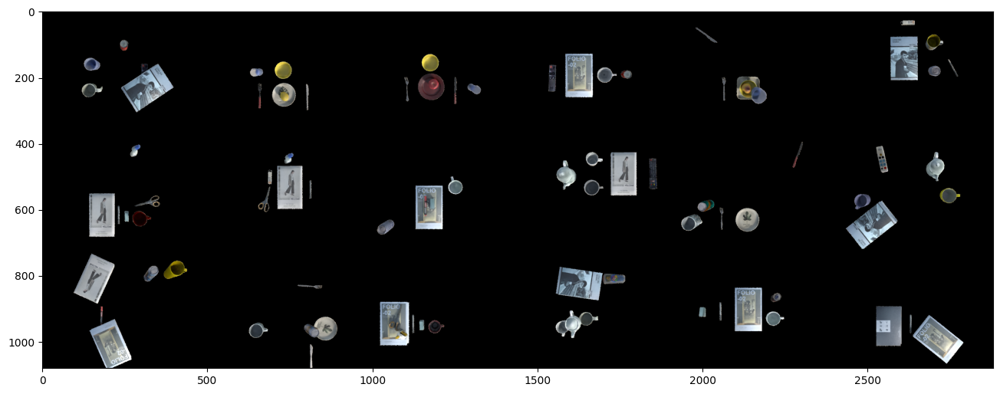

Score <  0.3
[0.75 0.75 0.75 1.   0.5  0.5 ]
[0.75 1.   0.   1.   0.5  0.25]
[0.5  0.5  0.75 0.25 1.   0.75]


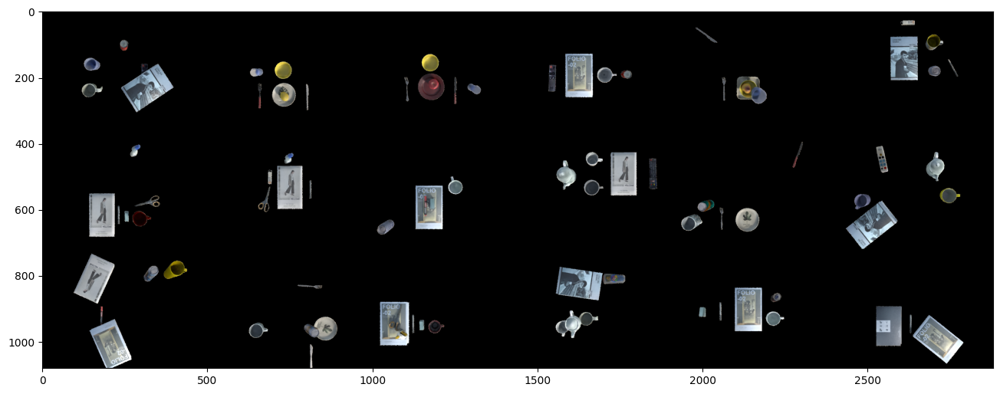

Accuracy: 0.5285714
Max: 0.25174662
Min: 0.14405972


In [8]:
over = 0.0 #0.7
under = 0.3 #-0.1

data_path = '/ssd/disk/TableTidyingUp/dataset_template/train'
#data_path = '/ssd/disk/TableTidyingUp/dataset_template/test-unseen_obj-seen_template'
#data_path = '/ssd/disk/TableTidyingUp/dataset_template/test-seen_obj-unseen_template'
# data_path = '/ssd/disk/TableTidyingUp/dataset_template/test-unseen_obj-unseen_template'
dataset = TabletopTemplateDataset(data_dir=data_path, 
            remove_bg=True, label_type='linspace', view='top', get_mask=True)
# dataset.fsize = 200
dataloader = DataLoader(dataset, batch_size=16, shuffle=True, num_workers=1)

accuracy, max_score, min_score = show_results_fft(model, dataloader, over, under)
print("Accuracy:", accuracy)
print("Max:", max_score)
print("Min:", min_score)

In [4]:
from utils import loadIQLRewardNetwork

device = "cuda:0"
model = loadIQLRewardNetwork('../iql/logs/0322_2108/iql_final.pth', None, sigmoid=True)
model.to(device)
model.eval()
print()

pybullet build time: Nov 28 2023 23:51:11


In [9]:
from utils import loadIQLRewardNetwork

device = "cuda:0"
model = loadIQLRewardNetwork('../iql/logs/0322_2154/iql_final.pth', None)#, sigmoid=True)
model.to(device)
model.eval()
print()

In [5]:
def show_results(model, dataloader, over=0.9, under=0.1):
    max_score = -np.inf
    min_score = np.inf
    
    scene_over = []
    scene_under = []
    scores_over = []
    scores_under = []
    
    matchings = []
    count = 0
    for X_val, Y_val in dataloader:
        x_raw = (X_val.cpu().numpy().transpose([0, 2, 3, 1]) * 255).astype(np.uint8)
        #X_val = preprocess(X_val).to(device)
        X_val = X_val.permute([0, 2, 3, 1]).to(device)
        Y_val = Y_val[:, 0].to(device)
        y_pred = model([X_val, None, None])[:, 0]
        #print(y_pred)
        if y_pred.max()>max_score:
            max_score = y_pred.detach().cpu().numpy().max()
        if y_pred.min()<min_score:
            min_score = y_pred.detach().cpu().numpy().min()
        
        indices = torch.logical_or(Y_val==0, Y_val==1)
        matching = (y_pred.round()==Y_val)[indices].float().detach().cpu().numpy()
        matchings.append(matching)

        scene_over.append(x_raw[y_pred.detach().cpu().numpy()>over])
        scene_under.append(x_raw[y_pred.detach().cpu().numpy()<under])
        scores_over.append(Y_val.detach().cpu().numpy()[y_pred.detach().cpu().numpy()>over])
        scores_under.append(Y_val.detach().cpu().numpy()[y_pred.detach().cpu().numpy()<under])
        count += 1
        if count > 20:
            break
    
    matchings = np.concatenate(matchings, axis=0)
    accuracy = np.mean(matchings)

    scene_over = np.concatenate(scene_over, axis=0)
    scene_under = np.concatenate(scene_under, axis=0)
    scores_over = np.concatenate(scores_over, axis=0)
    scores_under = np.concatenate(scores_under, axis=0)
    print("#over:", len(scene_over))
    print("#under:", len(scene_under))

    print("Score > ", over)
    scene_vstack = []
    fig = plt.figure(figsize=(16, 9))
    for i in range(3):
        print(scores_over[i*6: i*6+6])
        scene_hstack = np.concatenate(scene_over[i*6: i*6+6], axis=1)
        scene_vstack.append(scene_hstack)
    scene_patches = np.concatenate(scene_vstack, axis=0)
    plt.imshow(scene_patches.astype(np.uint8))
    plt.show()

    print("Score < ", under)
    scene_vstack = []
    fig = plt.figure(figsize=(16, 9))
    for i in range(3):
        print(scores_under[i*6: i*6+6])
        scene_hstack = np.concatenate(scene_under[i*6: i*6+6], axis=1)
        scene_vstack.append(scene_hstack)
    scene_patches = np.concatenate(scene_vstack, axis=0)
    plt.imshow(scene_patches.astype(np.uint8))
    plt.show()
    return accuracy, max_score, min_score

In [6]:
def measure_accuracy(model):
    accuracies = []
    data_path_list = [#'/ssd/disk/TableTidyingUp/dataset_template/train',
                    '/ssd/disk/TableTidyingUp/dataset_template/test-unseen_obj-seen_template',
                    '/ssd/disk/TableTidyingUp/dataset_template/test-seen_obj-unseen_template',
                    '/ssd/disk/TableTidyingUp/dataset_template/test-unseen_obj-unseen_template']
    for data_path in data_path_list:
        dataset = TabletopTemplateDataset(data_dir=data_path, 
                    remove_bg=True, label_type='linspace', view='top')
        dataloader = DataLoader(dataset, batch_size=16, shuffle=False, num_workers=1)
        matchings = []
        for X_val, Y_val in dataloader:
            X_val = X_val.permute([0, 2, 3, 1]).to(device)
            Y_val = Y_val[:, 0].to(device)
            y_pred = model([X_val, None, None])[:, 0]
            
            indices = torch.logical_or(Y_val==0, Y_val==1)
            matching = (y_pred.round()==Y_val)[indices].float().detach().cpu().numpy()
            matchings.append(matching)

        matchings = np.concatenate(matchings, axis=0)
        accuracy = np.mean(matchings)
        accuracies.append(accuracy)
    return accuracies

### 0322_2108 / iql_final.pth

#over: 39
#under: 271
Score >  0.7
[1.  1.  1.  1.  1.  0.5]
[0.75 1.   1.   1.   1.   1.  ]
[1.   1.   1.   0.75 1.   1.  ]


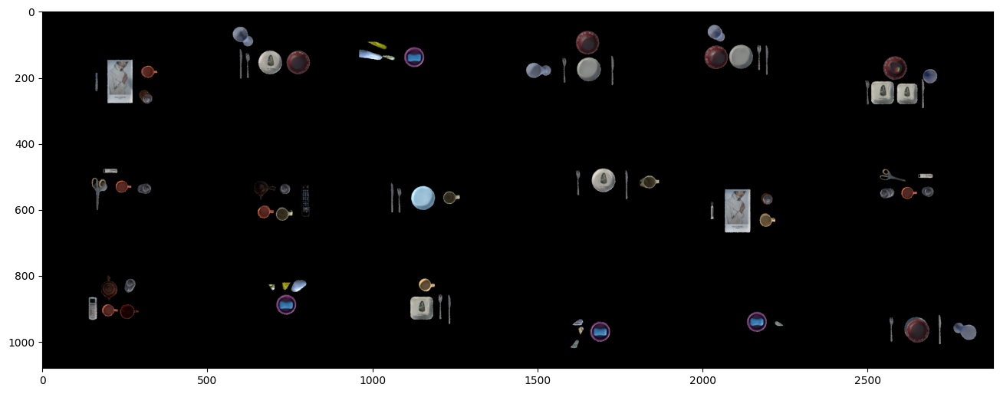

Score <  0.05
[0.75 0.5  0.   0.   0.   1.  ]
[0.25 0.75 0.75 0.25 0.   0.75]
[0.75 0.25 0.5  0.25 0.75 0.  ]


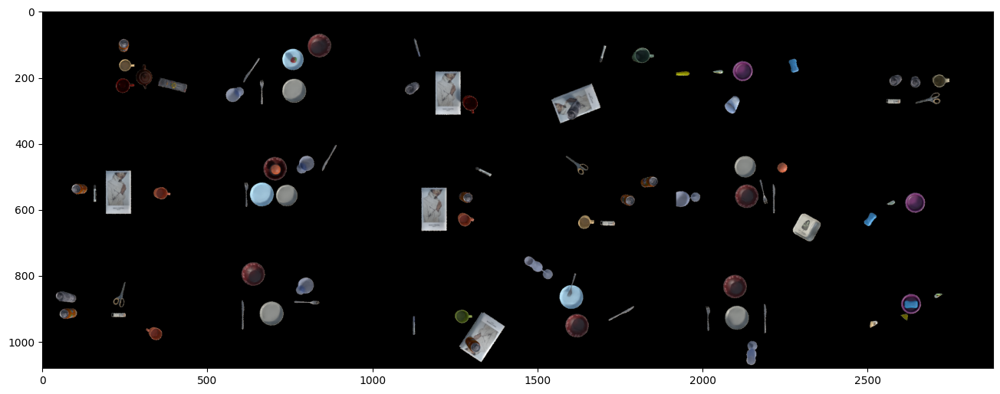

Accuracy: 0.76811594
Max: 0.9999496
Min: 3.2734072e-33


In [8]:
over = 0.7 #0.7
under = 0.05 #-0.1

#data_path = '/ssd/disk/TableTidyingUp/dataset_template/train'
#data_path = '/ssd/disk/TableTidyingUp/dataset_template/test-unseen_obj-seen_template'
#data_path = '/ssd/disk/TableTidyingUp/dataset_template/test-seen_obj-unseen_template'
data_path = '/ssd/disk/TableTidyingUp/dataset_template/test-unseen_obj-unseen_template'
dataset = TabletopTemplateDataset(data_dir=data_path, 
            remove_bg=True, label_type='linspace', view='top')
dataset.fsize = 200
dataloader = DataLoader(dataset, batch_size=16, shuffle=True, num_workers=1)

accuracy, max_score, min_score = show_results(model, dataloader, over, under)
print("Accuracy:", accuracy)
print("Max:", max_score)
print("Min:", min_score)

### 0322_2154 / iql_final.pth

#over: 76
#under: 98
Score >  0.7
[0.75 0.75 1.   1.   1.   1.  ]
[1.   1.   1.   0.75 1.   1.  ]
[0.5  1.   0.75 1.   0.75 1.  ]


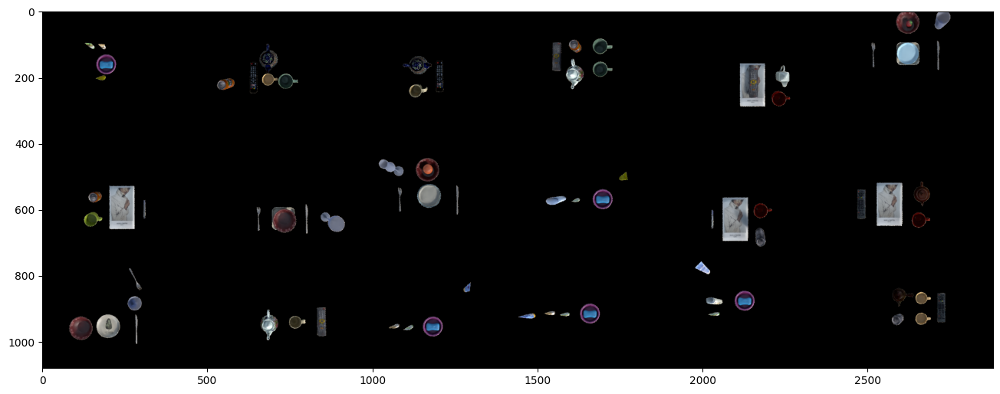

Score <  0.2
[0.5  0.   0.   0.25 0.   0.  ]
[0.5  0.75 0.25 0.   0.75 0.  ]
[0.   0.   0.   0.25 0.25 0.  ]


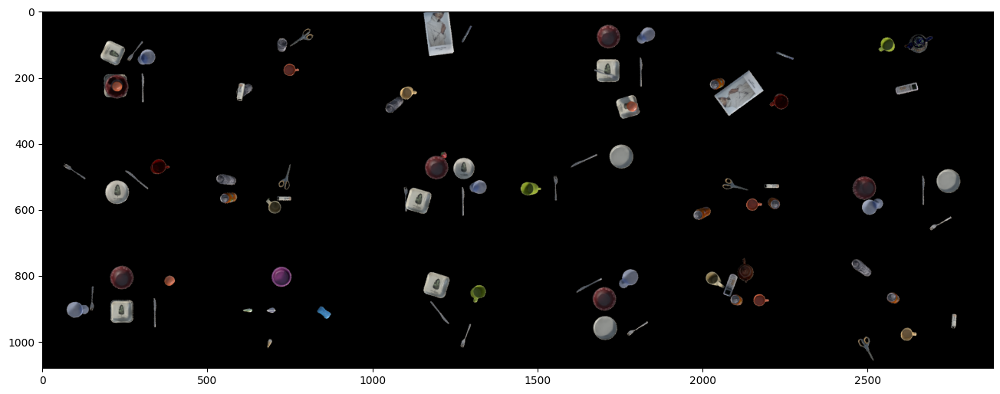

Accuracy: 0.89705884
Max: 1.3635349
Min: -0.6751258


In [11]:
over = 0.7 #0.7
under = 0.2 #-0.1

#data_path = '/ssd/disk/TableTidyingUp/dataset_template/train'
#data_path = '/ssd/disk/TableTidyingUp/dataset_template/test-unseen_obj-seen_template'
#data_path = '/ssd/disk/TableTidyingUp/dataset_template/test-seen_obj-unseen_template'
data_path = '/ssd/disk/TableTidyingUp/dataset_template/test-unseen_obj-unseen_template'
dataset = TabletopTemplateDataset(data_dir=data_path, 
            remove_bg=True, label_type='linspace', view='top')
dataset.fsize = 200
dataloader = DataLoader(dataset, batch_size=16, shuffle=True, num_workers=1)

accuracy, max_score, min_score = show_results(model, dataloader, over, under)
print("Accuracy:", accuracy)
print("Max:", max_score)
print("Min:", min_score)

### 0322_2154 / iql_e3.pth

In [6]:
accuracies = measure_accuracy(model)
#final", accuracies[0])
print("Test-US:", accuracies[0])
print("Test-SU:", accuracies[1])
print("Test-UU:", accuracies[2])

Test-US: 0.9346296
Test-SU: 0.92531645
Test-UU: 0.93265826


#over: 77
#under: 34
Score >  0.7
[1.   1.   1.   0.75 1.   0.75]
[1.   1.   1.   0.25 0.75 1.  ]
[1.  0.5 1.  1.  1.  1. ]


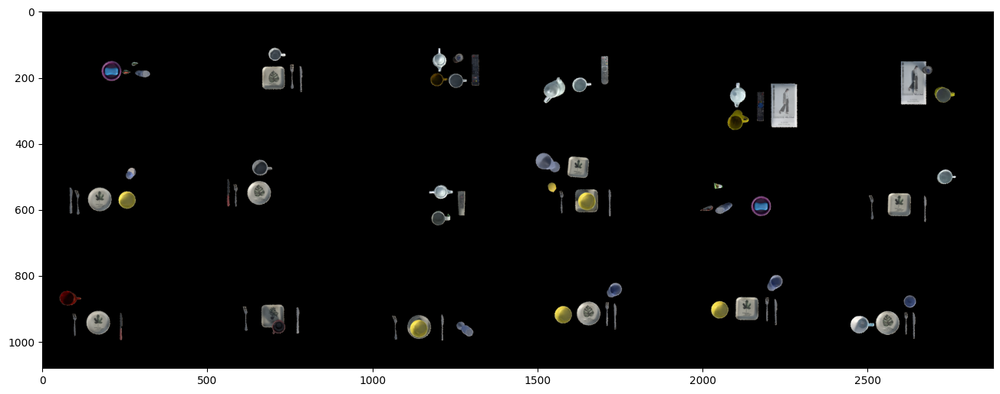

Score <  0.2
[0.25 0.25 0.25 0.   0.   0.  ]
[0.5  0.   0.   0.   0.25 0.  ]
[0.25 0.25 0.5  0.5  0.25 0.  ]


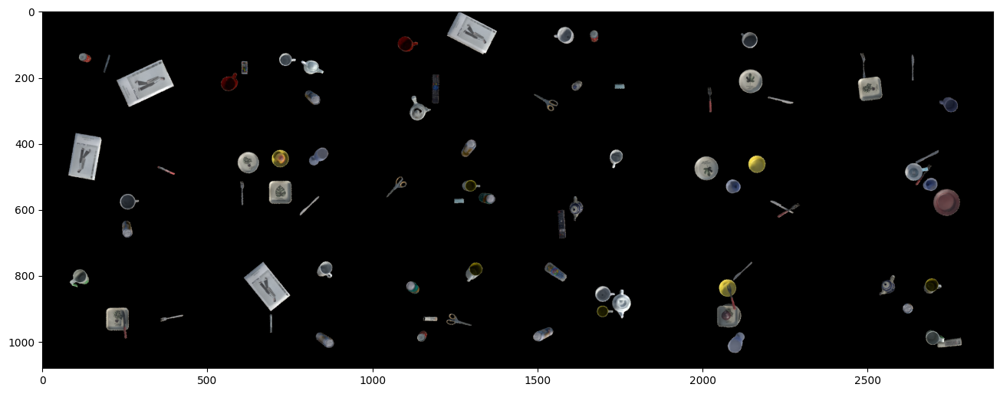

Accuracy: 0.95714283
Max: 1.1317466
Min: -0.04763776


In [8]:
over = 0.7 #0.7
under = 0.2 #-0.1

#data_path = '/ssd/disk/TableTidyingUp/dataset_template/train'
#data_path = '/ssd/disk/TableTidyingUp/dataset_template/test-unseen_obj-seen_template'
data_path = '/ssd/disk/TableTidyingUp/dataset_template/test-seen_obj-unseen_template'
#data_path = '/ssd/disk/TableTidyingUp/dataset_template/test-unseen_obj-unseen_template'
dataset = TabletopTemplateDataset(data_dir=data_path, 
            remove_bg=True, label_type='linspace', view='top')
dataset.fsize = 200
dataloader = DataLoader(dataset, batch_size=16, shuffle=True, num_workers=1)

accuracy, max_score, min_score = show_results(model, dataloader, over, under)
print("Accuracy:", accuracy)
print("Max:", max_score)
print("Min:", min_score)

### 0322_2108 / iql_e4.pth

In [10]:
accuracies = measure_accuracy(model)
#final", accuracies[0])
print("Test-US:", accuracies[0])
print("Test-SU:", accuracies[1])
print("Test-UU:", accuracies[2])

Test-US: 0.92938274
Test-SU: 0.8687764
Test-UU: 0.86227846


#over: 46
#under: 209
Score >  0.7
[0.75 0.75 1.   1.   1.   1.  ]
[1.   1.   1.   1.   0.75 1.  ]
[1. 1. 1. 1. 1. 1.]


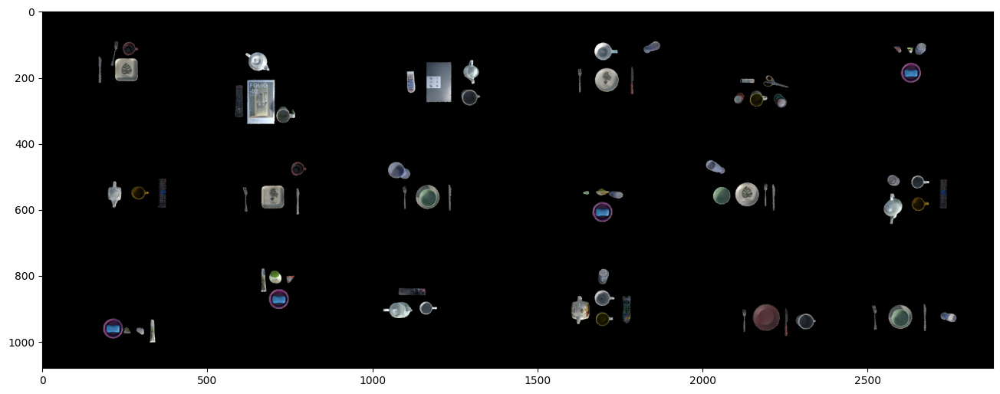

Score <  0.05
[1.   0.   0.75 0.5  0.   0.5 ]
[0.25 0.   0.25 0.   0.5  0.5 ]
[0.25 0.5  0.5  0.25 0.   0.75]


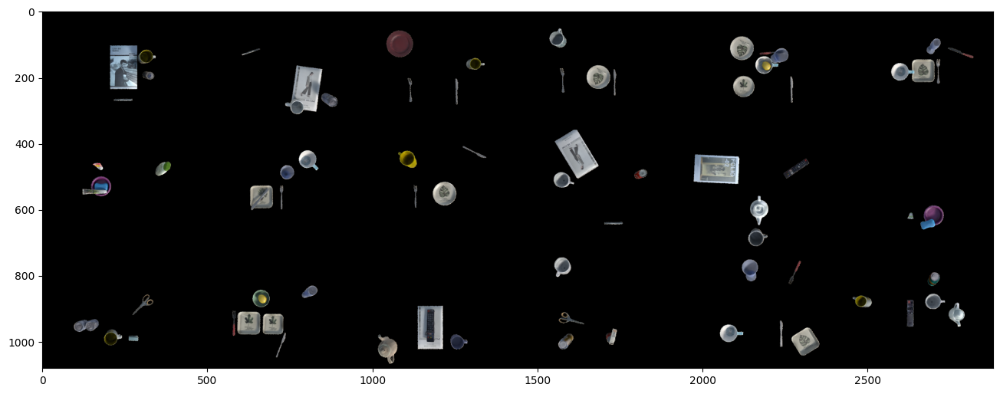

Accuracy: 0.8848921
Max: 0.9644741
Min: 1.7487612e-09


In [9]:
over = 0.7 #0.7
under = 0.05 #-0.1

#data_path = '/ssd/disk/TableTidyingUp/dataset_template/train'
#data_path = '/ssd/disk/TableTidyingUp/dataset_template/test-unseen_obj-seen_template'
data_path = '/ssd/disk/TableTidyingUp/dataset_template/test-seen_obj-unseen_template'
#data_path = '/ssd/disk/TableTidyingUp/dataset_template/test-unseen_obj-unseen_template'
dataset = Tabl5etopTemplateDataset(data_dir=data_path, 
            remove_bg=True, label_type='linspace', view='top')
dataset.fsize = 200
dataloader = DataLoader(dataset, batch_size=16, shuffle=True, num_workers=1)

accuracy, max_score, min_score = show_results(model, dataloader, over, under)
print("Accuracy:", accuracy)
print("Max:", max_score)
print("Min:", min_score)

### 0320_1849 / iql_final.pth

In [6]:
accuracies = measure_accuracy(model)
#final", accuracies[0])
print("Test-US:", accuracies[0])
print("Test-SU:", accuracies[1])
print("Test-UU:", accuracies[2])

Test-US: 0.81561726
Test-SU: 0.77109706
Test-UU: 0.7579747


#over: 51
#under: 119
Score >  0.5
[1.   1.   0.75 1.   1.   1.  ]
[1.   1.   1.   1.   1.   0.75]
[0.   1.   0.25 1.   1.   1.  ]


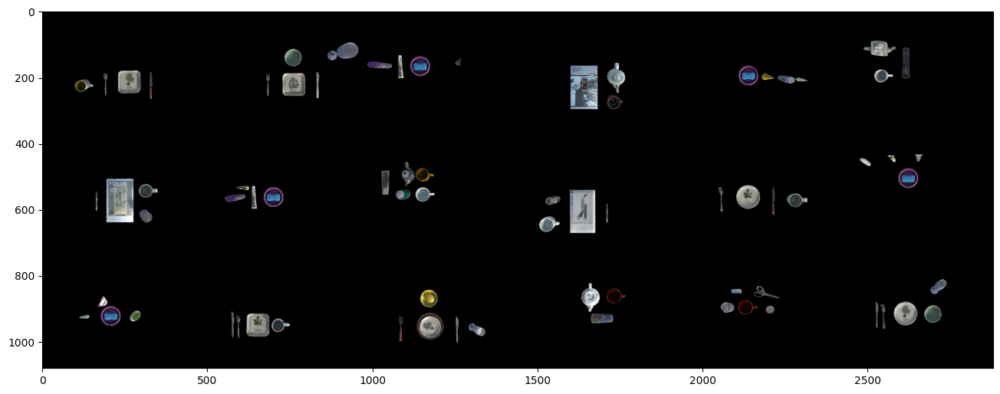

Score <  0
[0.25 0.75 0.75 0.25 0.5  0.  ]
[0.5  0.5  0.25 0.25 0.75 0.5 ]
[0.   0.5  0.25 0.5  0.25 0.5 ]


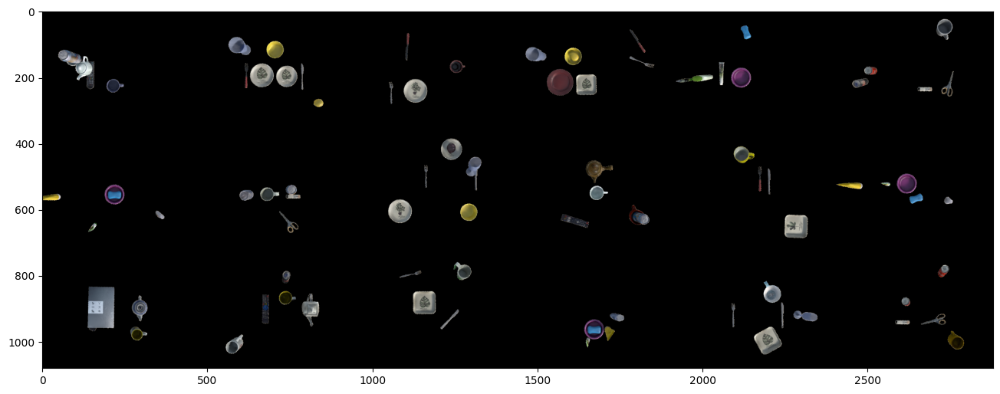

Accuracy: 0.84375
Max: 1.4601489
Min: -0.32513905


In [11]:
over = 0.5 #0.7
under = 0 #-0.1

#data_path = '/ssd/disk/TableTidyingUp/dataset_template/train'
#data_path = '/ssd/disk/TableTidyingUp/dataset_template/test-unseen_obj-seen_template'
data_path = '/ssd/disk/TableTidyingUp/dataset_template/test-seen_obj-unseen_template'
#data_path = '/ssd/disk/TableTidyingUp/dataset_template/test-unseen_obj-unseen_template'
dataset = TabletopTemplateDataset(data_dir=data_path, 
            remove_bg=True, label_type='linspace', view='top')
dataset.fsize = 200
dataloader = DataLoader(dataset, batch_size=16, shuffle=True, num_workers=1)

accuracy, max_score, min_score = show_results(model, dataloader, over, under)
print("Accuracy:", accuracy)
print("Max:", max_score)
print("Min:", min_score)

# Template-data

In [3]:
resnet = resnet18
model_path = 'data/classification/top_nobg_linspace_mse-0.pth'
#data_path = '/ssd/disk/TableTidyingUp/dataset_template/train'
#data_path = '/ssd/disk/TableTidyingUp/dataset_template/test-unseen_obj-seen_template'
#data_path = '/ssd/disk/TableTidyingUp/dataset_template/test-seen_obj-unseen_template'
data_path = '/ssd/disk/TableTidyingUp/dataset_template/test-unseen_obj-unseen_template'
device = "cuda:0"

dataset = TabletopTemplateDataset(data_dir=data_path, 
            remove_bg=True, label_type='linspace', view='top')
dataset.fsize = 200
dataloader = DataLoader(dataset, batch_size=16, shuffle=False, num_workers=1)

model = resnet(pretrained=False)
fc_in_features = model.fc.in_features

model.fc = nn.Sequential(
    nn.Linear(fc_in_features, 1),
    #nn.Sigmoid()
)
model.load_state_dict(torch.load(model_path))
model.to(device)
model.eval()

preprocess = transforms.Compose([
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

In [4]:
def show_results(model, dataloader, over=0.9, under=0.1):
    scene_over = []
    scene_under = []
    count = 0
    for X_val, Y_val in dataloader:
        x_raw = X_val.cpu().numpy().transpose([0, 2, 3, 1])
        X_val = preprocess(X_val).to(device)
        Y_val = Y_val[:, 0].to(device)
        y_pred = model(X_val)[:, 0].detach().cpu().numpy()

        scene_over.append(x_raw[y_pred>over])
        scene_under.append(x_raw[y_pred<under])
        count += 1
        if count > 20:
            break

    scene_over = np.concatenate(scene_over, axis=0)
    scene_under = np.concatenate(scene_under, axis=0)

    print("Score > ", over)
    scene_vstack = []
    fig = plt.figure(figsize=(16, 9))
    for i in range(3):
        scene_hstack = np.concatenate(scene_over[i*6: i*6+6], axis=1)
        scene_vstack.append(scene_hstack)
    scene_patches = np.concatenate(scene_vstack, axis=0)
    plt.imshow(scene_patches.astype(np.uint8))
    plt.show()

    print("Score < ", under)
    scene_vstack = []
    fig = plt.figure(figsize=(16, 9))
    for i in range(3):
        scene_hstack = np.concatenate(scene_under[i*6: i*6+6], axis=1)
        scene_vstack.append(scene_hstack)
    scene_patches = np.concatenate(scene_vstack, axis=0)
    plt.imshow(scene_patches.astype(np.uint8))
    plt.show()

### Without Background

#### Train

skip /ssd/disk/TableTidyingUp/dataset_template/train/O9/template_00001/traj_00002 (4 steps)
Score >  0.9


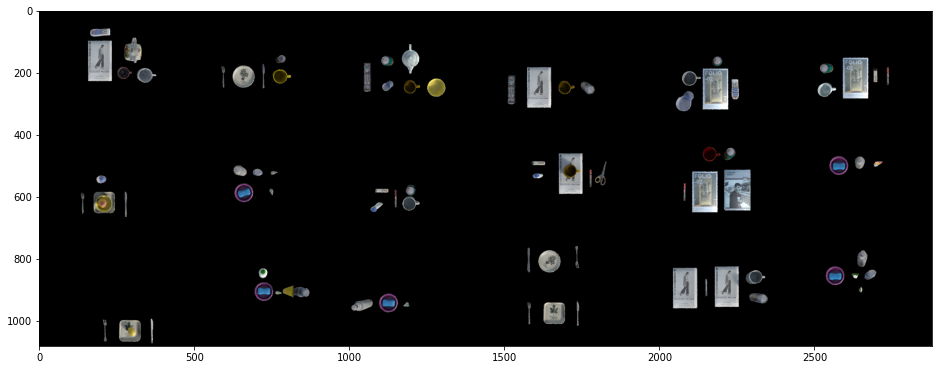

Score <  0.1


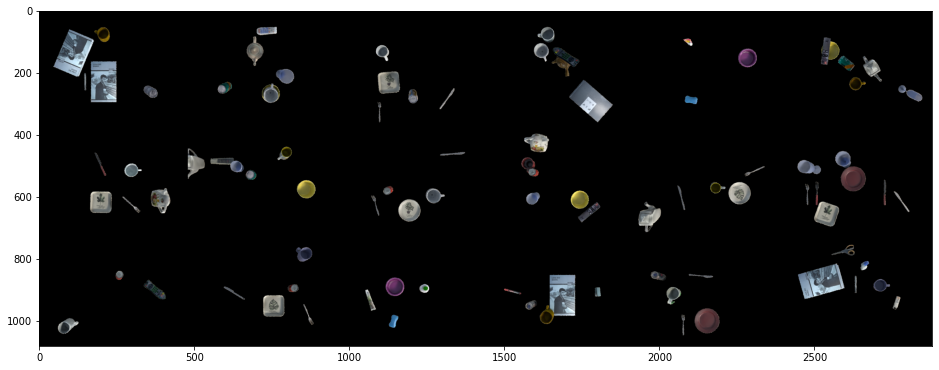

In [17]:
over = 0.9
under = 0.1

data_path = '/ssd/disk/TableTidyingUp/dataset_template/train'
dataset = TabletopTemplateDataset(data_dir=data_path, 
            remove_bg=True, label_type='linspace', view='top')
dataset.fsize = 200
dataloader = DataLoader(dataset, batch_size=16, shuffle=True, num_workers=1)

show_results(model, dataloader, over, under)

#### Test (Seen objects / unseen templates)

Score >  0.9


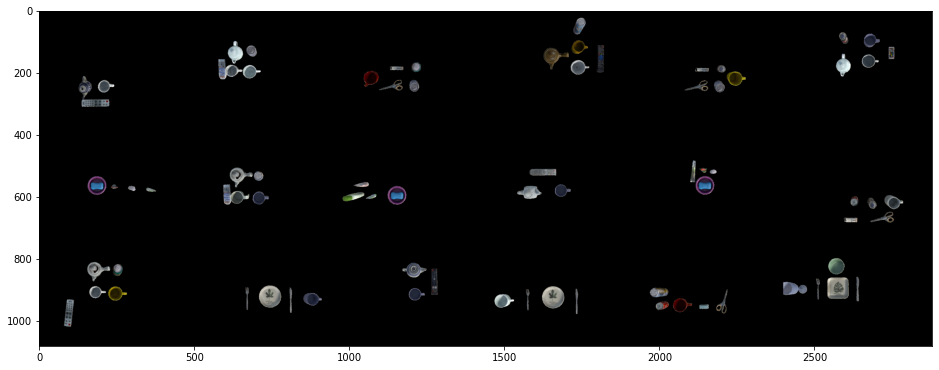

Score <  0.1


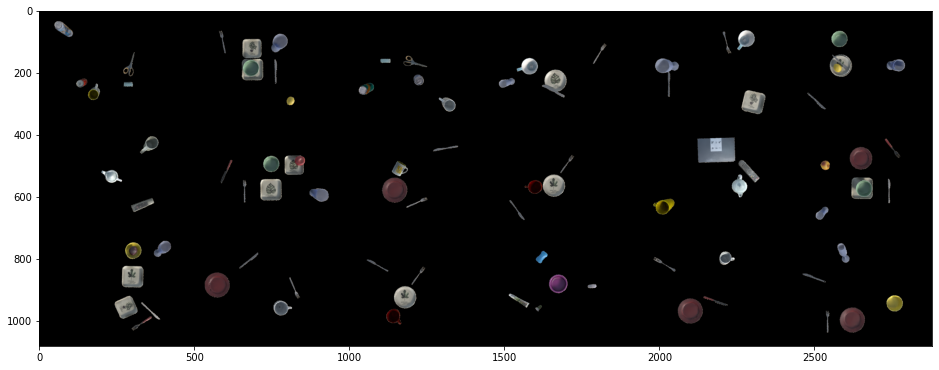

In [14]:
over = 0.9
under = 0.1

data_path = '/ssd/disk/TableTidyingUp/dataset_template/test-seen_obj-unseen_template'
dataset = TabletopTemplateDataset(data_dir=data_path, 
            remove_bg=True, label_type='linspace', view='top')
dataset.fsize = 200
dataloader = DataLoader(dataset, batch_size=16, shuffle=True, num_workers=1)

show_results(model, dataloader, over, under)

#### Test (Unseen objects / unseen templates)

Score >  0.9


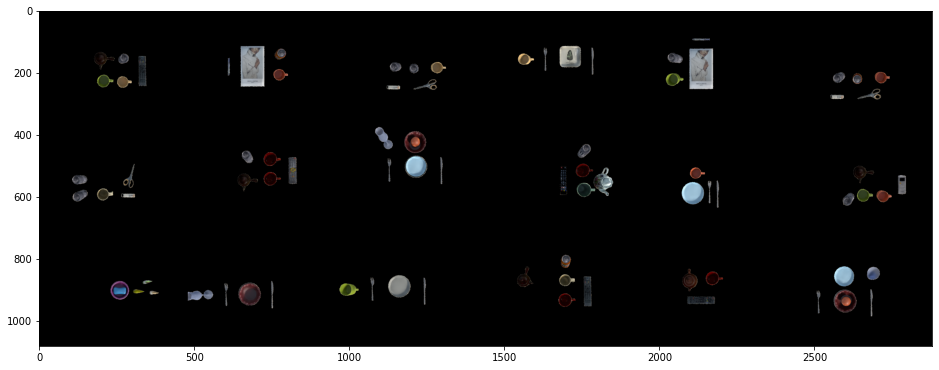

Score <  0.1


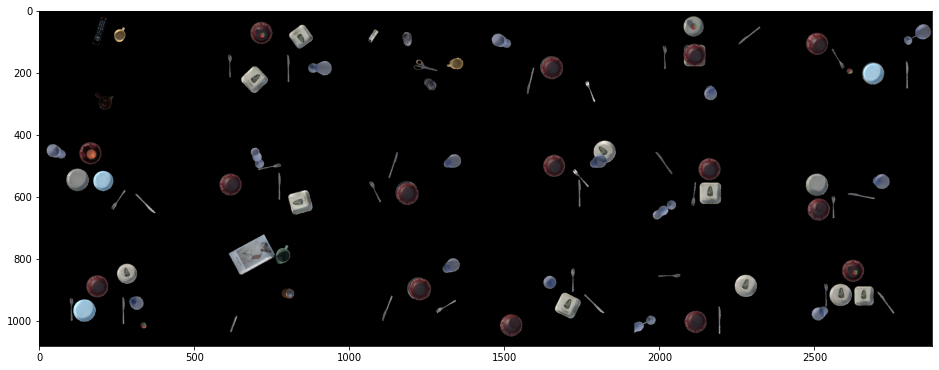

In [15]:
over = 0.9
under = 0.1

data_path = '/ssd/disk/TableTidyingUp/dataset_template/test-unseen_obj-unseen_template'
dataset = TabletopTemplateDataset(data_dir=data_path, 
            remove_bg=True, label_type='linspace', view='top')
dataset.fsize = 200
dataloader = DataLoader(dataset, batch_size=16, shuffle=True, num_workers=1)

show_results(model, dataloader, over, under)

### With Background

In [5]:
resnet = resnet18
model_path = 'data/classification/top_bg_linspace_mse-4.pth'

model = resnet(pretrained=False)
fc_in_features = model.fc.in_features

model.fc = nn.Sequential(
    nn.Linear(fc_in_features, 1),
    #nn.Sigmoid()
)
model.load_state_dict(torch.load(model_path))
model.to(device)
model.eval()

preprocess = transforms.Compose([
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

#### Train data

skip /ssd/disk/TableTidyingUp/dataset_template/train/O9/template_00001/traj_00002 (4 steps)
Score >  0.95


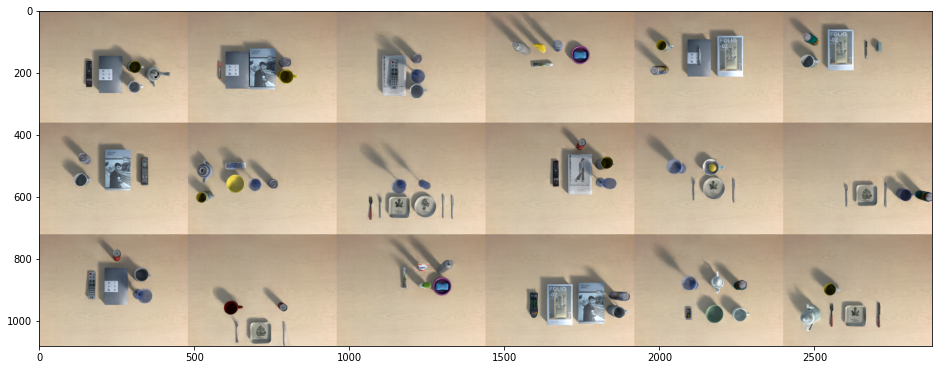

Score <  0.05


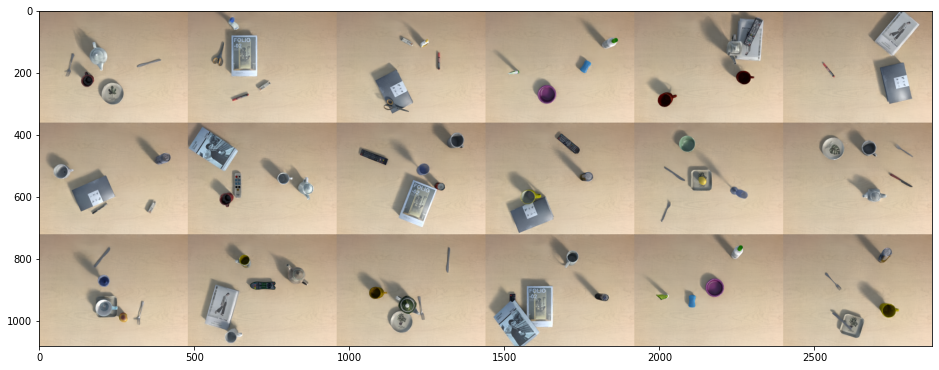

In [9]:
over = 0.95
under = 0.05

data_path = '/ssd/disk/TableTidyingUp/dataset_template/train'
dataset = TabletopTemplateDataset(data_dir=data_path, 
            remove_bg=False, label_type='linspace', view='top')
dataset.fsize = 200
dataloader = DataLoader(dataset, batch_size=16, shuffle=True, num_workers=1)

show_results(model, dataloader, over, under)

#### Test (Seen objects / uneen templates)

Score >  0.8


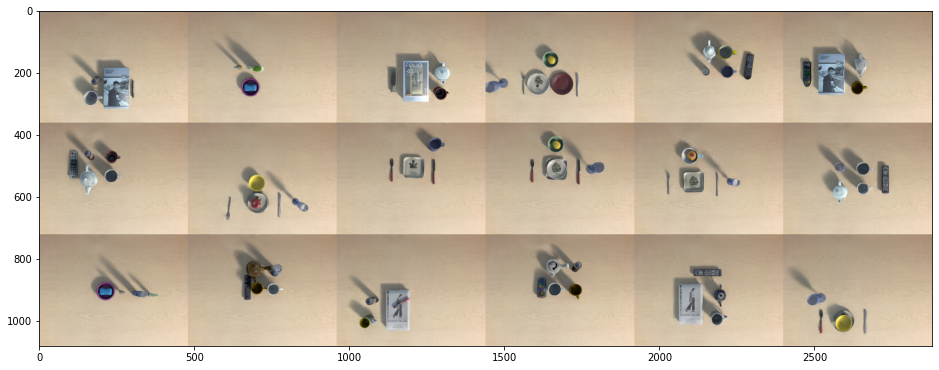

Score <  0.2


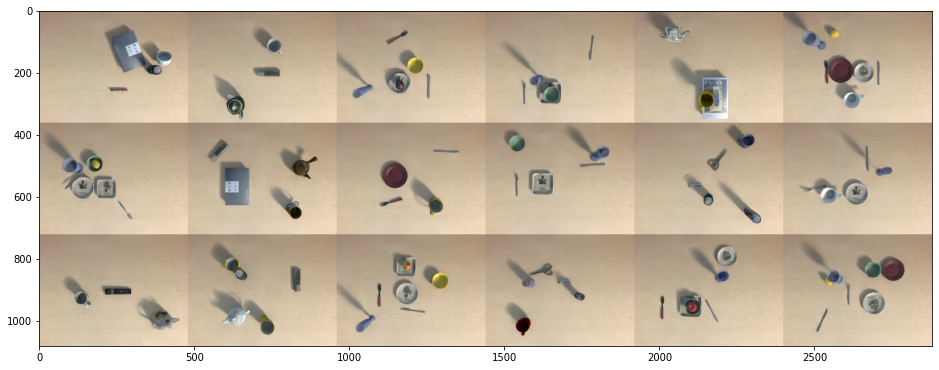

In [9]:
over = 0.8
under = 0.2

data_path = '/ssd/disk/TableTidyingUp/dataset_template/test-seen_obj-unseen_template'
dataset = TabletopTemplateDataset(data_dir=data_path, 
            remove_bg=False, label_type='linspace', view='top')
dataset.fsize = 200
dataloader = DataLoader(dataset, batch_size=16, shuffle=True, num_workers=1)

show_results(model, dataloader, over, under)

#### Test (Unseen objects / Seen templates)

Score >  0.8


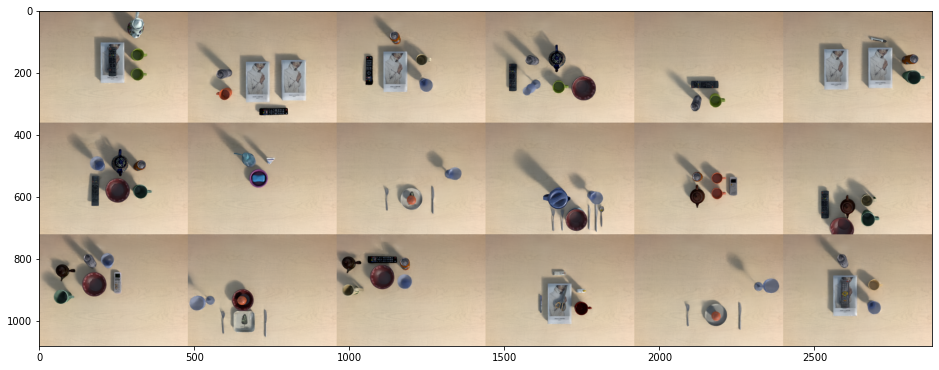

Score <  0.2


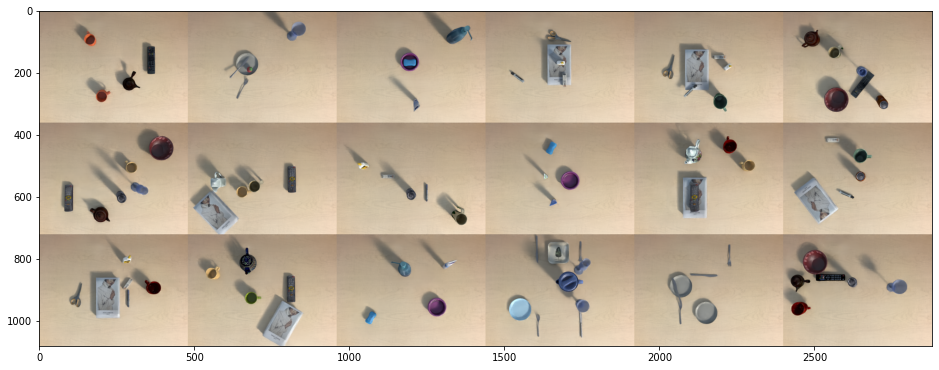

In [7]:
over = 0.8
under = 0.2

data_path = '/ssd/disk/TableTidyingUp/dataset_template/test-unseen_obj-seen_template'
dataset = TabletopTemplateDataset(data_dir=data_path, 
            remove_bg=False, label_type='linspace', view='top')
dataset.fsize = 200
dataloader = DataLoader(dataset, batch_size=16, shuffle=True, num_workers=1)

show_results(model, dataloader, over, under)

Score: 0.99357903


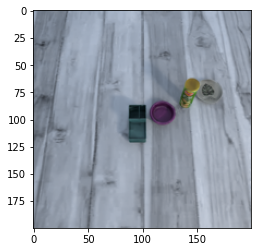

Score: 0.06445152


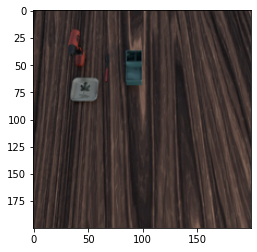

Score: 0.062768154


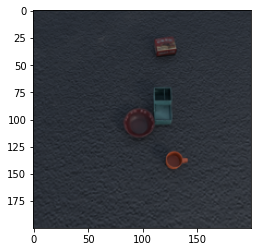

Score: 0.5413759


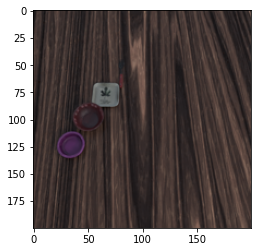

Score: 0.8273533


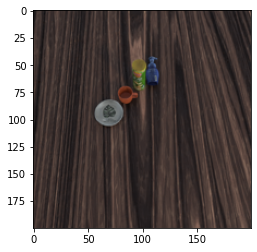

Score: 0.9414153


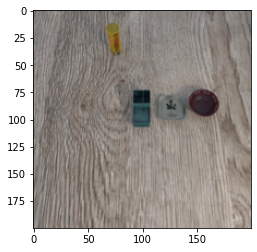

Score: 0.00859533


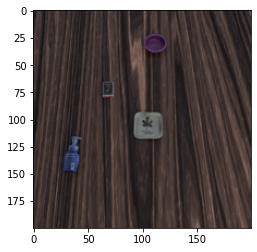

Score: 0.8844764


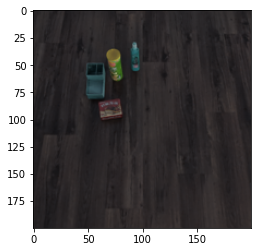

Score: 0.077291325


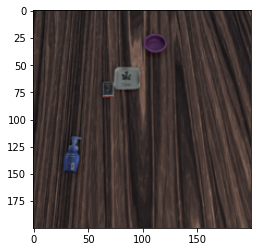

Score: 0.046042886


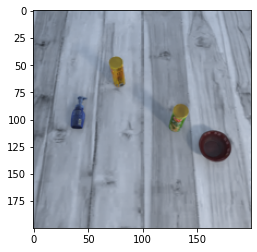

Score: 0.98886395


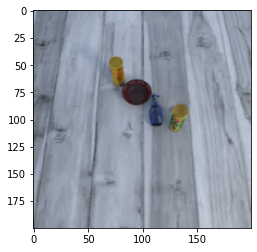

Score: 0.97365665


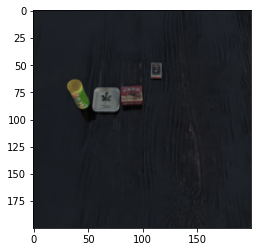

Score: 0.566526


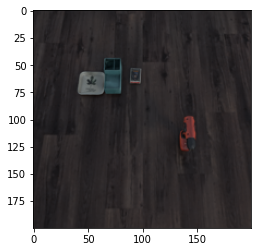

Score: 0.030925635


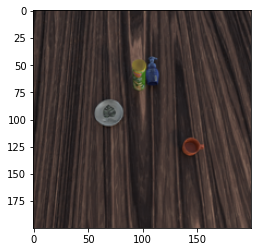

Score: 0.107845716


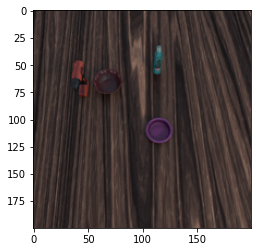

Score: 0.92985


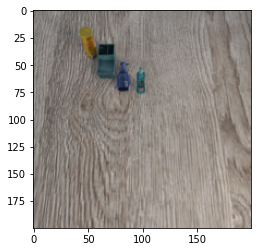

Score: 0.4840622


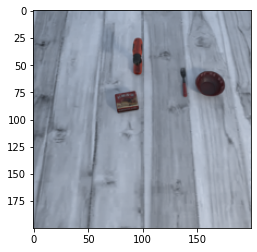

Score: 0.28442764


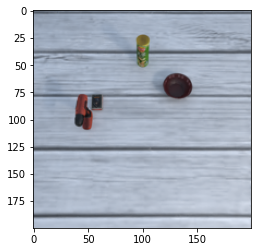

Score: 0.15251733


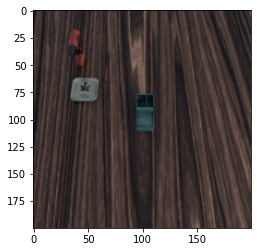

Score: 0.60084426


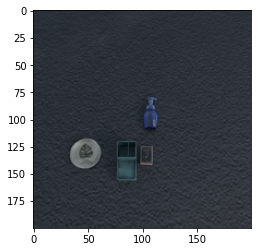

Score: 0.16548909


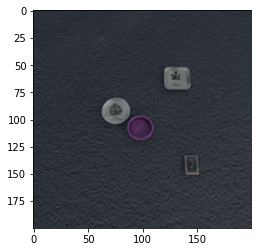

Score: 0.0042716204


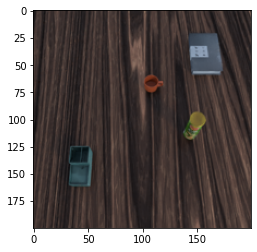

Score: 0.39229658


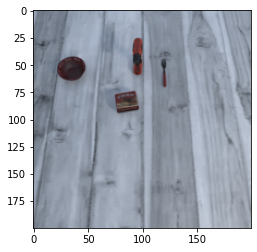

Score: 0.2750521


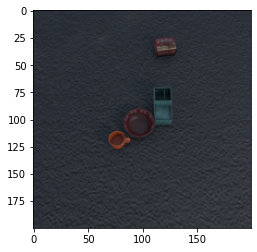

Score: 0.58981025


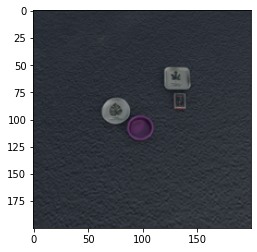

Score: 0.76255083


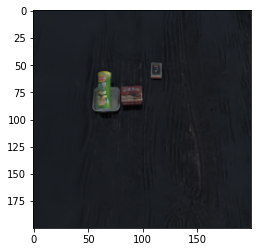

Score: 0.88530254


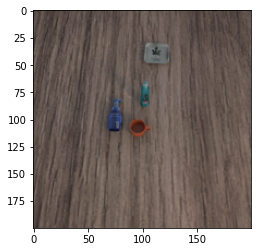

Score: 0.08311667


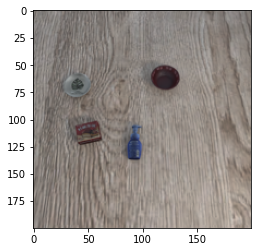

Score: 0.2978176


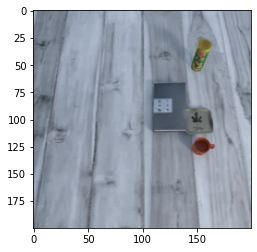

Score: 0.66554505


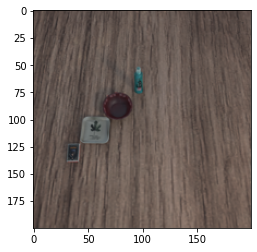

Score: 0.940809


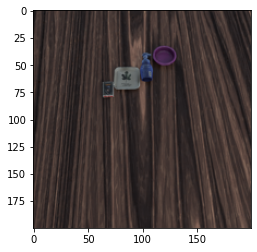

Score: 0.239443


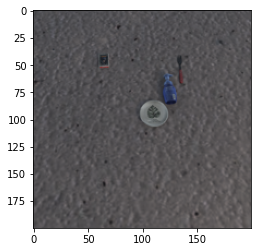

Score: 0.34410194


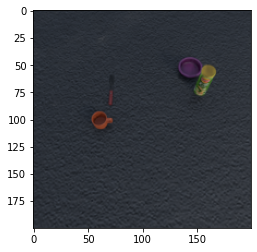

Score: 0.4281149


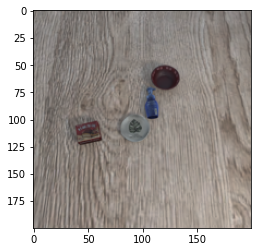

Score: 0.24255776


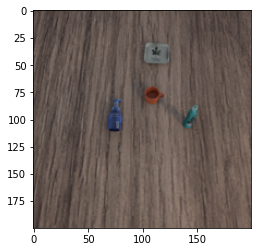

Score: 0.106760055


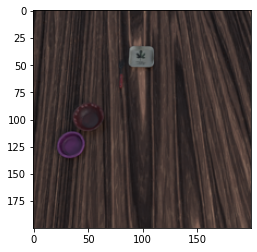

Score: 0.2946148


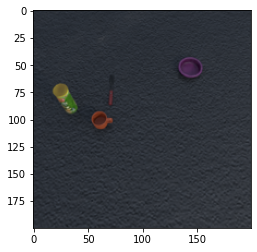

Score: 0.052079264


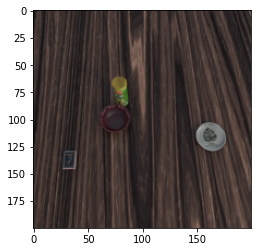

Score: 0.27282444


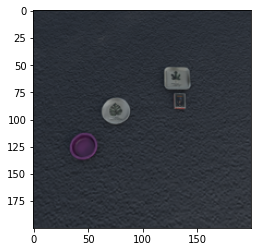

Score: 0.34221324


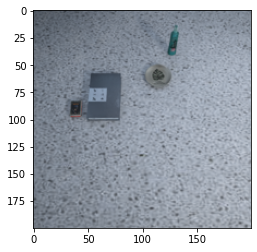

Score: 0.62531626


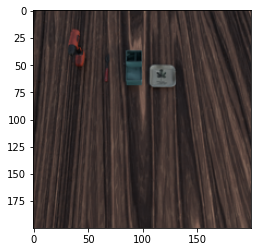

Score: 0.64021236


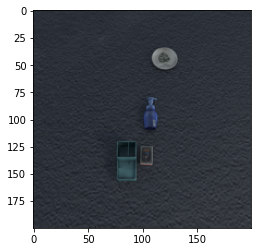

Score: 0.72655815


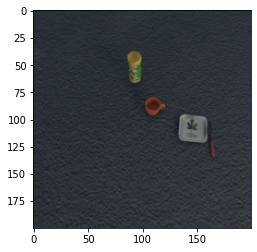

Score: 0.13874766


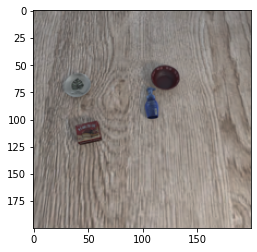

Score: 0.051286522


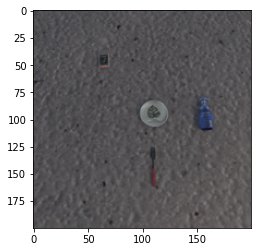

Score: 0.21426323


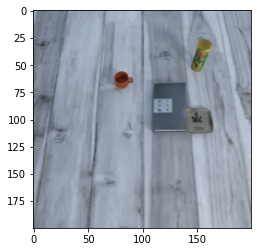

Score: 0.95883024


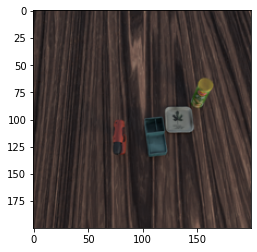

Score: 0.005080558


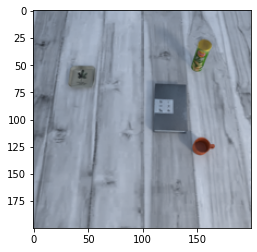

In [11]:
count = 0
for X_val, Y_val in dataloader:
    x_raw = X_val.cpu().numpy().transpose([0, 2, 3, 1])
    X_val = preprocess(X_val).to(device)
    Y_val = Y_val[:, 0].to(device)
    y_pred = model(X_val)[:, 0].detach().cpu().numpy()
    
    for i in range(12):
        print("Score:", y_pred[i])
        plt.imshow(x_raw[i].astype(np.uint8))
        plt.show()
    count += 1
    if count > 3:
        break

# Linear-shape

## Full RGB

In [3]:
resnet = resnet18
model_path = 'data/classification/noft_best.pth' #'finetune_29.pth' #'noft_29.pth' #'model_29.pth'
data_path = '/ssd/disk/ur5_tidying_data/pybullet_line/test'
device = "cuda:0"

dataset = PybulletNpyDataset(data_dir=data_path)
dataset.fsize = 200
dataloader = DataLoader(dataset, batch_size=16, shuffle=False, num_workers=1)

model = resnet(pretrained=False)
fc_in_features = model.fc.in_features

model.fc = nn.Sequential(
    nn.Linear(fc_in_features, 1),
    nn.Sigmoid()
)
model.load_state_dict(torch.load(model_path))
model.to(device)
model.eval()

preprocess = transforms.Compose([
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

Score >  0.95


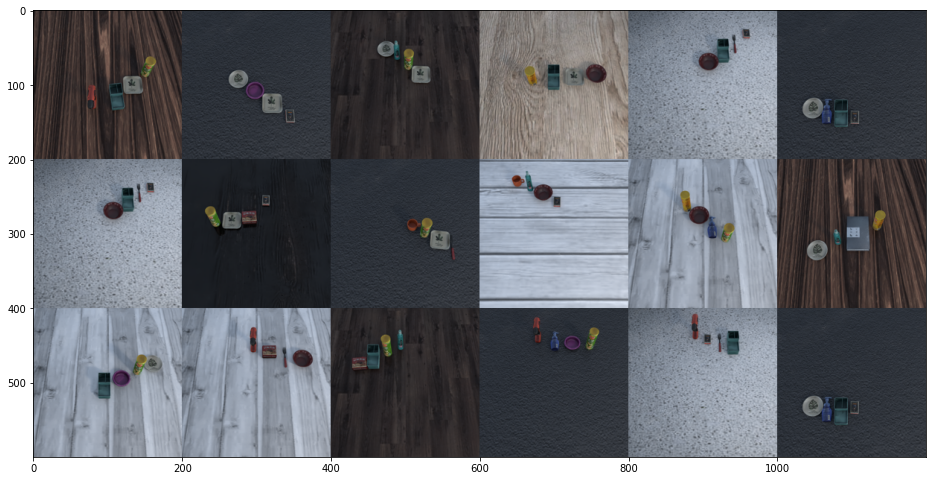

Score <  0.05


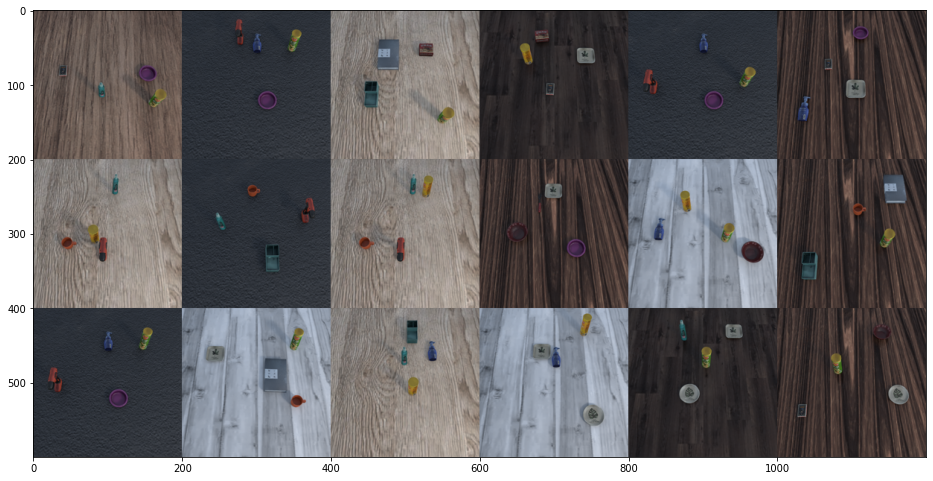

In [14]:
over = 0.95
under = 0.05
scene_over = []
scene_under = []

dataloader = DataLoader(dataset, batch_size=16, shuffle=True, num_workers=1)

count = 0
for X_val, Y_val in dataloader:
    x_raw = X_val.cpu().numpy().transpose([0, 2, 3, 1])
    X_val = preprocess(X_val).to(device)
    Y_val = Y_val[:, 0].to(device)
    y_pred = model(X_val)[:, 0].detach().cpu().numpy()
    
    scene_over.append(x_raw[y_pred>over])
    scene_under.append(x_raw[y_pred<under])
    count += 1
    
scene_over = np.concatenate(scene_over, axis=0)
scene_under = np.concatenate(scene_under, axis=0)

print("Score > ", over)
scene_vstack = []
fig = plt.figure(figsize=(16, 9))
for i in range(3):
    scene_hstack = np.concatenate(scene_over[i*6: i*6+6], axis=1)
    scene_vstack.append(scene_hstack)
scene_patches = np.concatenate(scene_vstack, axis=0)
plt.imshow(scene_patches)
plt.show()

print("Score < ", under)
scene_vstack = []
fig = plt.figure(figsize=(16, 9))
for i in range(3):
    scene_hstack = np.concatenate(scene_under[i*6: i*6+6], axis=1)
    scene_vstack.append(scene_hstack)
scene_patches = np.concatenate(scene_vstack, axis=0)
plt.imshow(scene_patches)
plt.show()

Score: 0.99357903


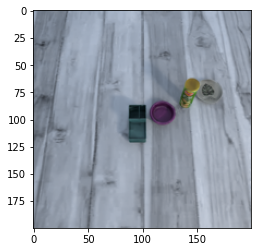

Score: 0.06445152


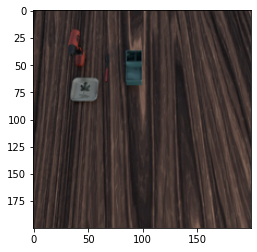

Score: 0.062768154


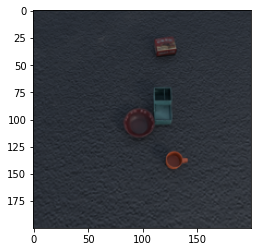

Score: 0.5413759


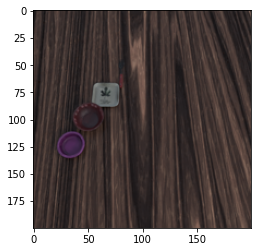

Score: 0.8273533


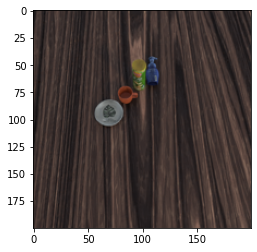

Score: 0.9414153


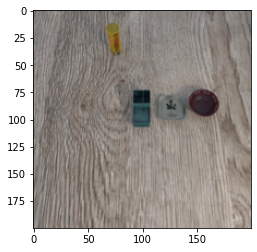

Score: 0.00859533


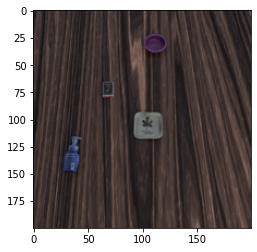

Score: 0.8844764


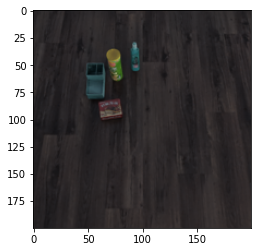

Score: 0.077291325


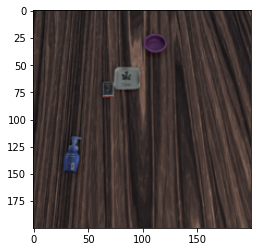

Score: 0.046042886


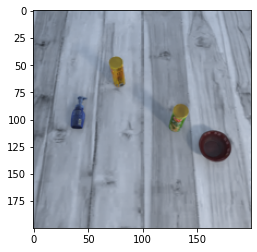

Score: 0.98886395


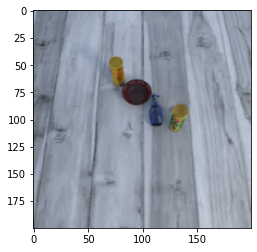

Score: 0.97365665


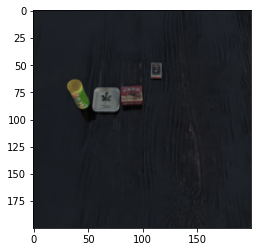

Score: 0.566526


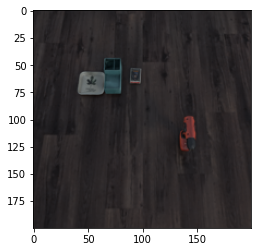

Score: 0.030925635


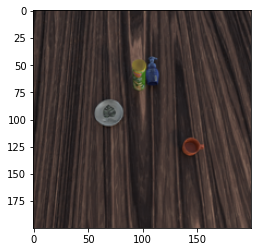

Score: 0.107845716


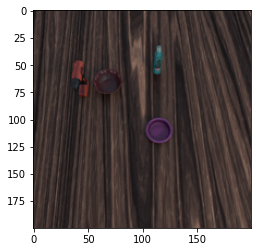

Score: 0.92985


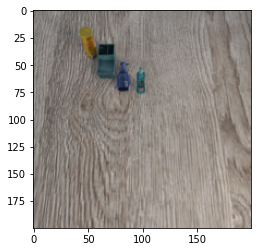

Score: 0.4840622


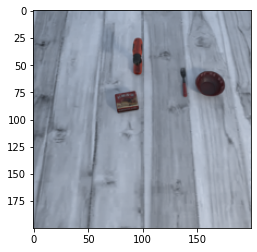

Score: 0.28442764


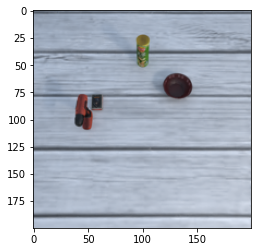

Score: 0.15251733


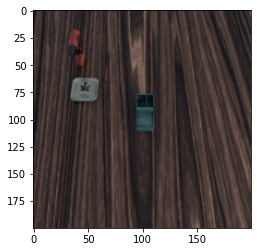

Score: 0.60084426


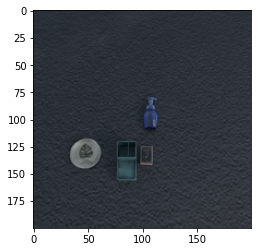

Score: 0.16548909


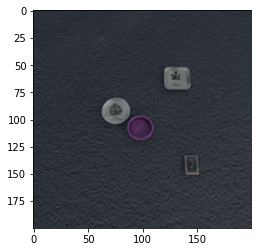

Score: 0.0042716204


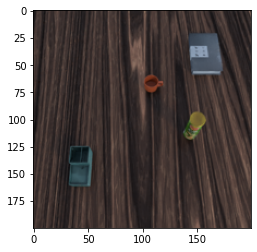

Score: 0.39229658


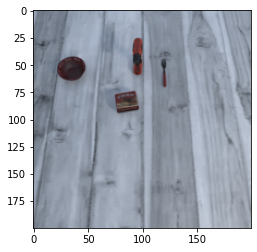

Score: 0.2750521


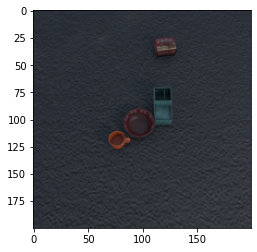

Score: 0.58981025


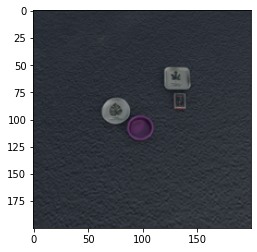

Score: 0.76255083


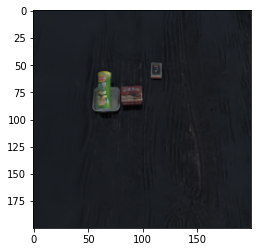

Score: 0.88530254


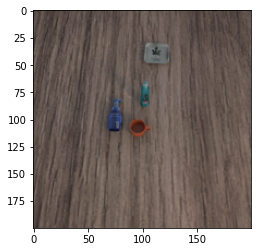

Score: 0.08311667


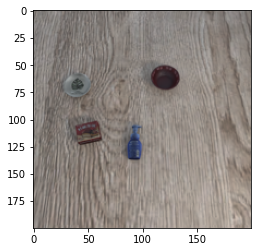

Score: 0.2978176


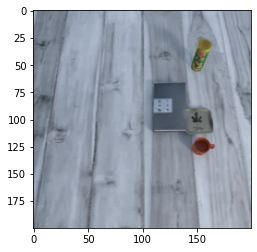

Score: 0.66554505


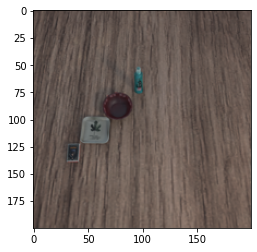

Score: 0.940809


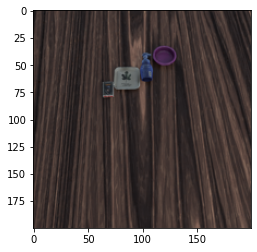

Score: 0.239443


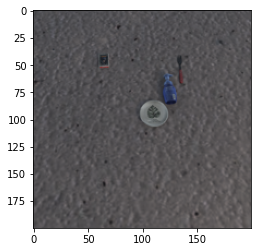

Score: 0.34410194


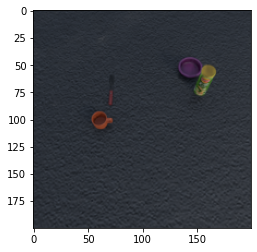

Score: 0.4281149


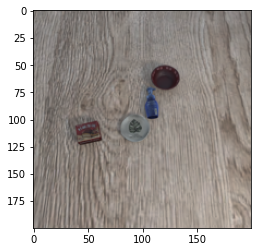

Score: 0.24255776


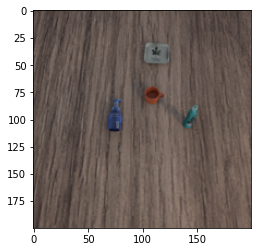

Score: 0.106760055


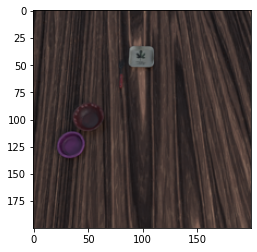

Score: 0.2946148


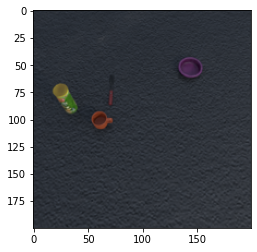

Score: 0.052079264


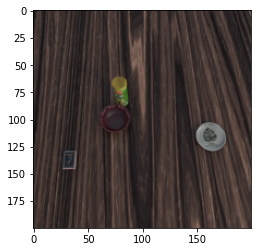

Score: 0.27282444


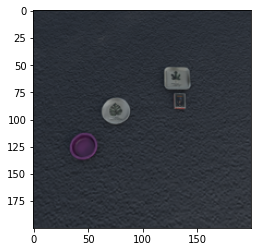

Score: 0.34221324


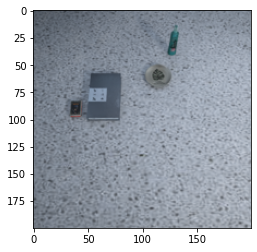

Score: 0.62531626


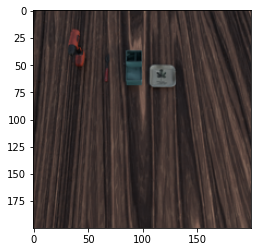

Score: 0.64021236


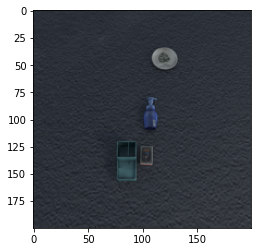

Score: 0.72655815


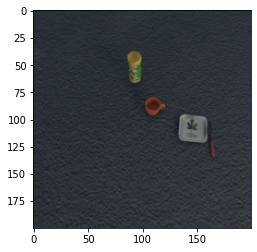

Score: 0.13874766


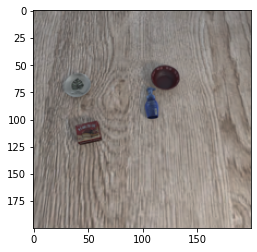

Score: 0.051286522


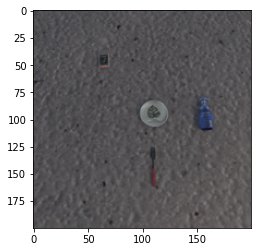

Score: 0.21426323


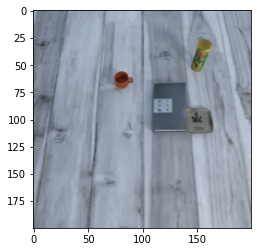

Score: 0.95883024


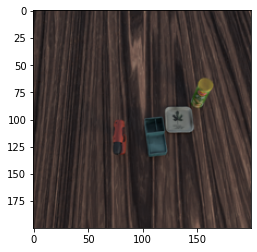

Score: 0.005080558


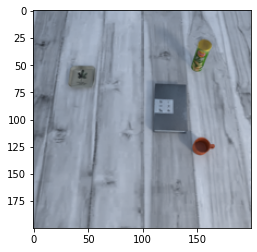

In [11]:
count = 0
for X_val, Y_val in dataloader:
    x_raw = X_val.cpu().numpy().transpose([0, 2, 3, 1])
    X_val = preprocess(X_val).to(device)
    Y_val = Y_val[:, 0].to(device)
    y_pred = model(X_val)[:, 0].detach().cpu().numpy()
    
    for i in range(12):
        print("Score:", y_pred[i])
        plt.imshow(x_raw[i])
        plt.show()
    count += 1
    if count > 3:
        break

## Remove BG

In [20]:
resnet = resnet18
model_path = 'data/classification/mse_nobg_best.pth' #'finetune_29.pth' #'noft_29.pth' #'model_29.pth'
data_path = '/ssd/disk/ur5_tidying_data/pybullet_single_bg/test'
device = "cuda:0"

dataset = PybulletNpyDataset(data_dir=data_path)
dataset.fsize = 200
dataloader = DataLoader(dataset, batch_size=16, shuffle=False, num_workers=1)

model = resnet(pretrained=False)
fc_in_features = model.fc.in_features

model.fc = nn.Sequential(
    nn.Linear(fc_in_features, 1),
    nn.Sigmoid()
)
model.load_state_dict(torch.load(model_path))
model.to(device)
model.eval()

preprocess = transforms.Compose([
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

Score >  0.65


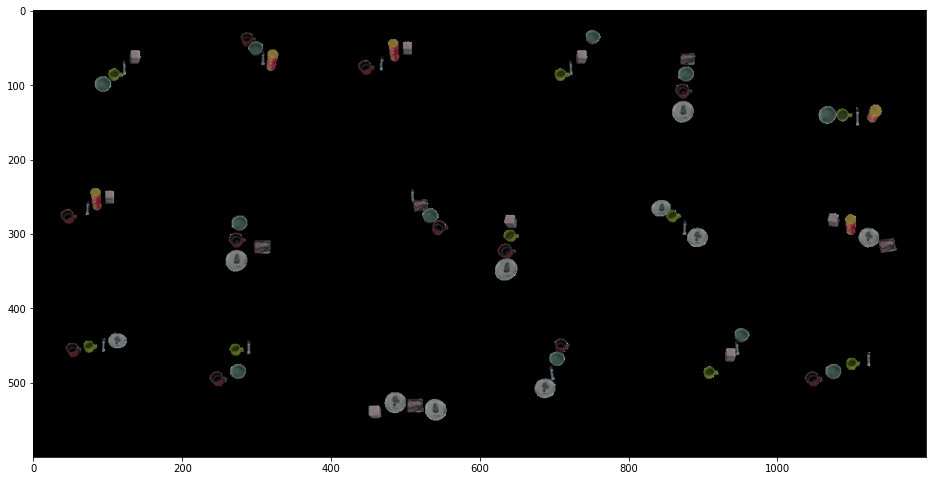

Score <  0.6


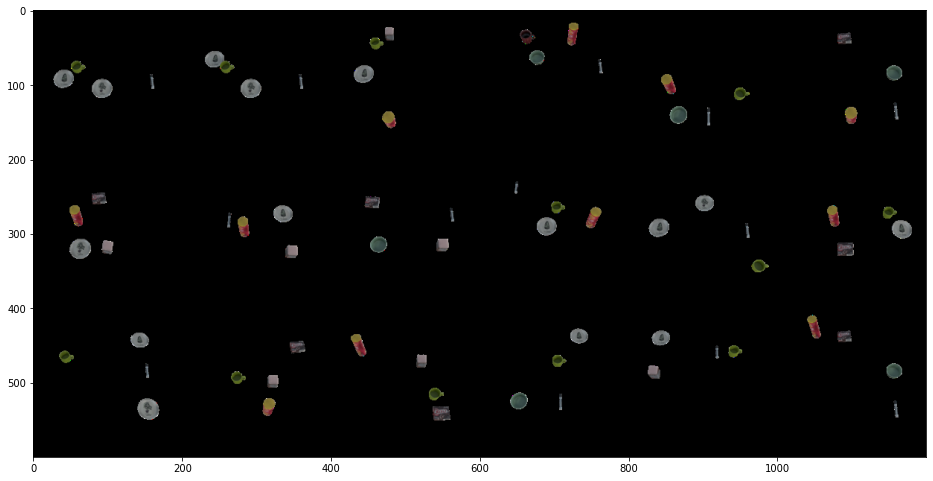

In [26]:
over = 0.65
under = 0.6
scene_over = []
scene_under = []

dataloader = DataLoader(dataset, batch_size=16, shuffle=True, num_workers=1)

count = 0
for X_val, Y_val in dataloader:
    x_raw = X_val.cpu().numpy().transpose([0, 2, 3, 1])
    X_val = preprocess(X_val).to(device)
    Y_val = Y_val[:, 0].to(device)
    y_pred = model(X_val)[:, 0].detach().cpu().numpy()
    
    scene_over.append(x_raw[y_pred>over])
    scene_under.append(x_raw[y_pred<under])
    count += 1
    
scene_over = np.concatenate(scene_over, axis=0)
scene_under = np.concatenate(scene_under, axis=0)

print("Score > ", over)
scene_vstack = []
fig = plt.figure(figsize=(16, 9))
for i in range(3):
    scene_hstack = np.concatenate(scene_over[i*6: i*6+6], axis=1)
    scene_vstack.append(scene_hstack)
scene_patches = np.concatenate(scene_vstack, axis=0)
plt.imshow(scene_patches)
plt.show()

print("Score < ", under)
scene_vstack = []
fig = plt.figure(figsize=(16, 9))
for i in range(3):
    scene_hstack = np.concatenate(scene_under[i*6: i*6+6], axis=1)
    scene_vstack.append(scene_hstack)
scene_patches = np.concatenate(scene_vstack, axis=0)
plt.imshow(scene_patches)
plt.show()

In [28]:
count = 0
for X_val, Y_val in dataloader:
    x_raw = X_val.cpu().numpy().transpose([0, 2, 3, 1])
    X_val = preprocess(X_val).to(device)
    Y_val = Y_val[:, 0].to(device)
    y_pred = model(X_val)[:, 0].detach().cpu().numpy()
    
    for i in range(12):
        print("Score:", y_pred[i])
        plt.imshow(x_raw[i])
        plt.show()
    count += 1
    if count > 3:
        break

## Replace BG

In [10]:
resnet = resnet18
model_path = 'data/classification/rmbg_best.pth' #'finetune_29.pth' #'noft_29.pth' #'model_29.pth'
data_path = '/ssd/disk/ur5_tidying_data/pybullet_remove_bg/test'
device = "cuda:0"

dataset = PybulletNpyDataset(data_dir=data_path)
dataset.fsize = 200
dataloader = DataLoader(dataset, batch_size=16, shuffle=False, num_workers=1)

model = resnet(pretrained=False)
fc_in_features = model.fc.in_features

model.fc = nn.Sequential(
    nn.Linear(fc_in_features, 1),
    nn.Sigmoid()
)
model.load_state_dict(torch.load(model_path))
model.to(device)
model.eval()

preprocess = transforms.Compose([
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

Score >  0.8


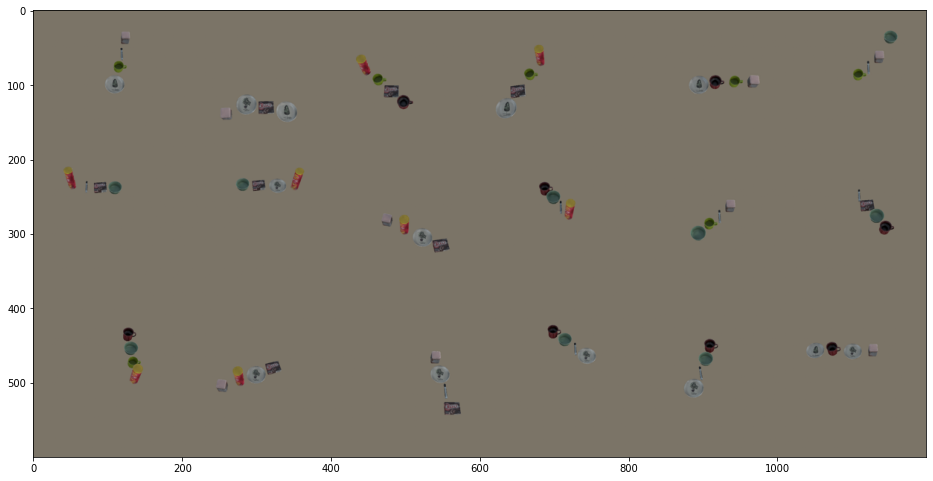

Score <  0.1


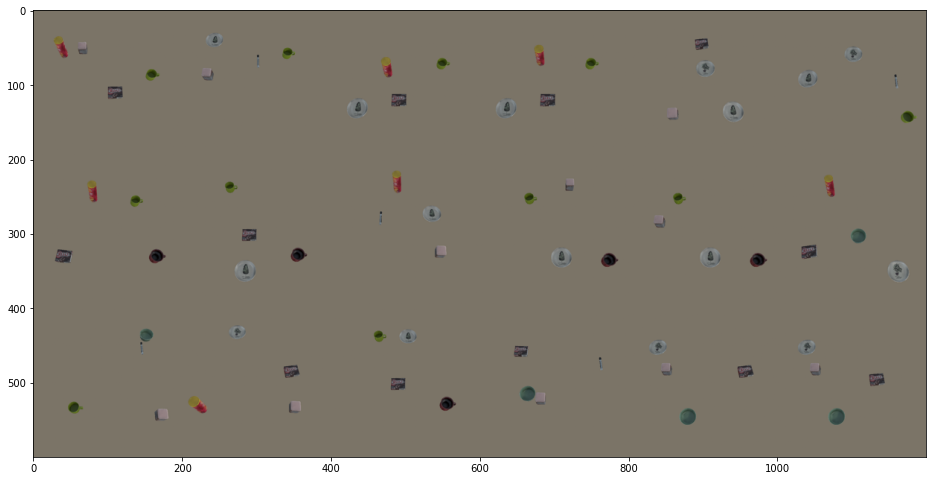

In [15]:
over = 0.8
under = 0.1
scene_over = []
scene_under = []

dataloader = DataLoader(dataset, batch_size=16, shuffle=True, num_workers=1)

count = 0
for X_val, Y_val in dataloader:
    x_raw = X_val.cpu().numpy().transpose([0, 2, 3, 1])
    X_val = preprocess(X_val).to(device)
    Y_val = Y_val[:, 0].to(device)
    y_pred = model(X_val)[:, 0].detach().cpu().numpy()
    
    scene_over.append(x_raw[y_pred>over])
    scene_under.append(x_raw[y_pred<under])
    count += 1
    
scene_over = np.concatenate(scene_over, axis=0)
scene_under = np.concatenate(scene_under, axis=0)

print("Score > ", over)
scene_vstack = []
fig = plt.figure(figsize=(16, 9))
for i in range(3):
    scene_hstack = np.concatenate(scene_over[i*6: i*6+6], axis=1)
    scene_vstack.append(scene_hstack)
scene_patches = np.concatenate(scene_vstack, axis=0)
plt.imshow(scene_patches)
plt.show()

print("Score < ", under)
scene_vstack = []
fig = plt.figure(figsize=(16, 9))
for i in range(3):
    scene_hstack = np.concatenate(scene_under[i*6: i*6+6], axis=1)
    scene_vstack.append(scene_hstack)
scene_patches = np.concatenate(scene_vstack, axis=0)
plt.imshow(scene_patches)
plt.show()

In [7]:
import os
import numpy as np
from matplotlib import pyplot as plt
from PIL import Image

In [2]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.models import resnet18, resnet34, resnet50

In [5]:
from utils import loadRewardFunction

device = "cuda:0"
model_path = 'data/classification-best/top_nobg_linspace_mse-best.pth'
model, preprocess = loadRewardFunction(model_path)
model.to(device)
model.eval()
print()

In [16]:
np.array(im).shape

(360, 480, 3)

In [18]:
real_images = [f for f in os.listdir('/home/gun/Desktop/segment-anything/notebooks/images') if f[:1]=='F']
image_dir = '/home/gun/Desktop/segment-anything/notebooks/images'

npy_images = []
for img_file in real_images:
    img_path = os.path.join(image_dir, img_file)
    im = Image.open(img_path)
    npy_images.append(np.array(im)/255.)

npy_images = np.concatenate(npy_images).reshape(len(npy_images), 360, 480, 3)

state = torch.Tensor(npy_images).permute([0,3,1,2]).to(torch.float32).cuda()
state = preprocess(state)
reward = model(state).cpu().detach().numpy()
print(reward)

[[ 0.45041323]
 [-0.25105768]
 [ 0.2866641 ]
 [ 0.00835736]
 [ 0.56991965]
 [ 0.10001982]
 [ 0.5387741 ]
 [ 0.04520636]
 [-0.07538174]
 [ 0.05018774]
 [ 0.5730496 ]
 [ 0.7175564 ]
 [ 0.6499906 ]
 [ 0.31563446]
 [ 0.8336559 ]
 [ 0.49417487]
 [ 0.20602652]
 [ 0.41326004]]


Score: [0.45041323]


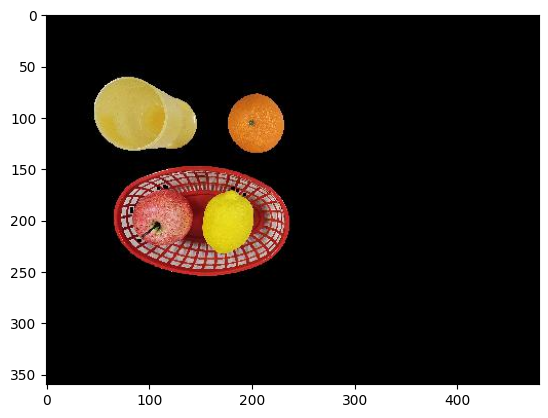

Score: [-0.25105768]


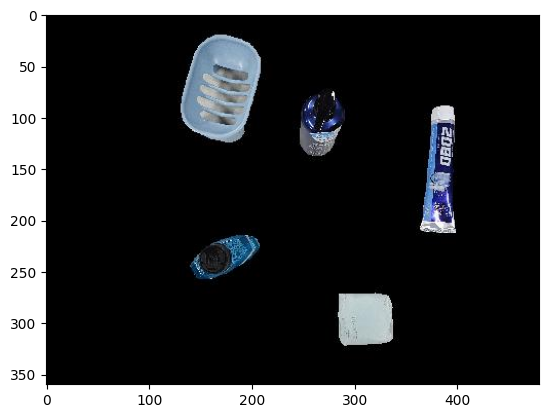

Score: [0.2866641]


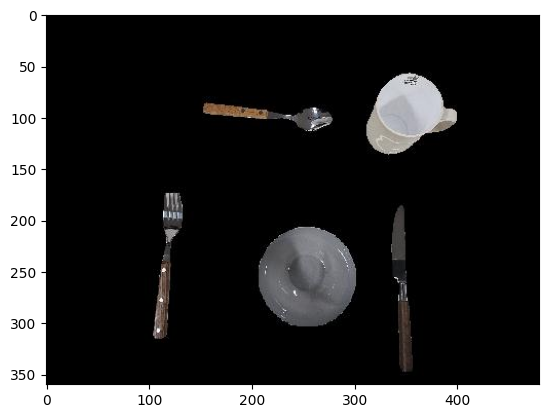

Score: [0.00835736]


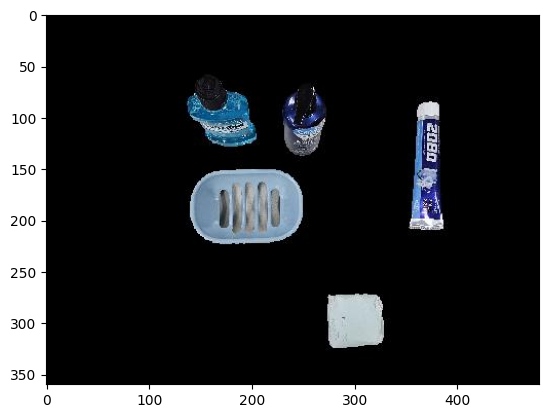

Score: [0.56991965]


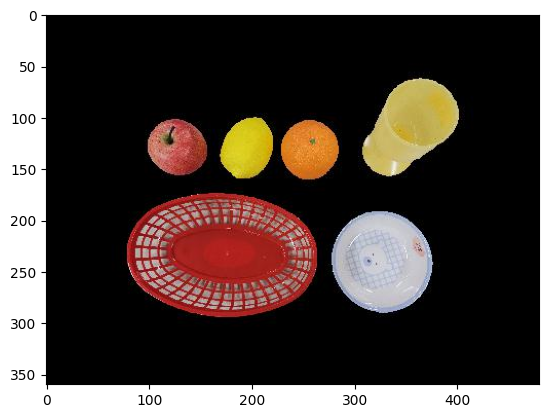

Score: [0.10001982]


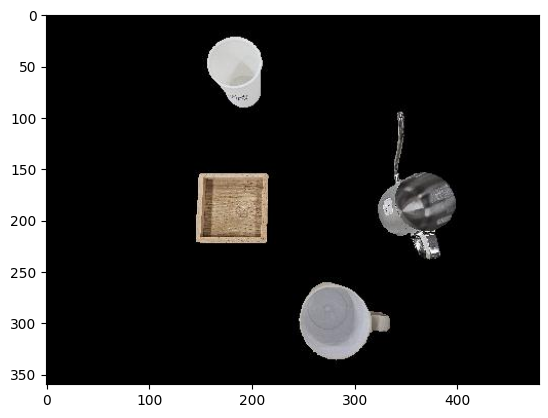

Score: [0.5387741]


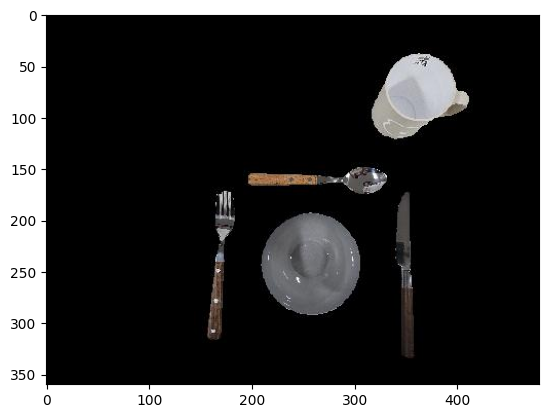

Score: [0.04520636]


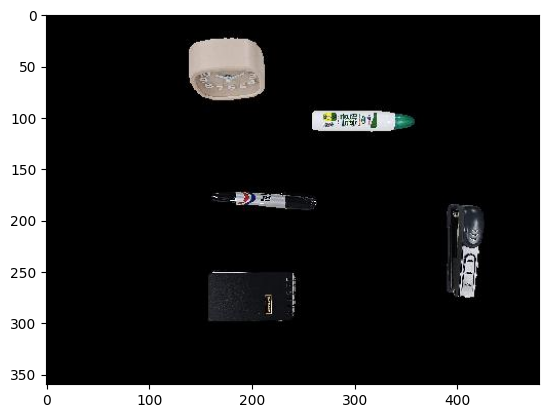

Score: [-0.07538174]


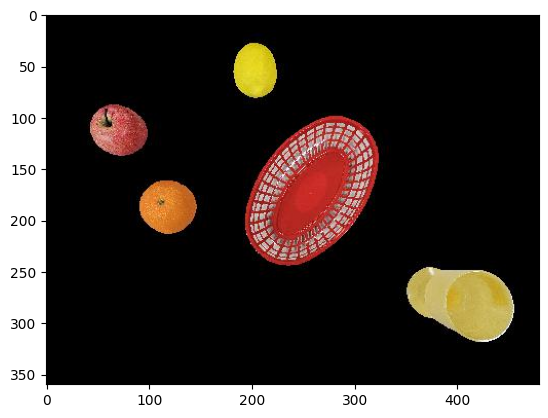

Score: [0.05018774]


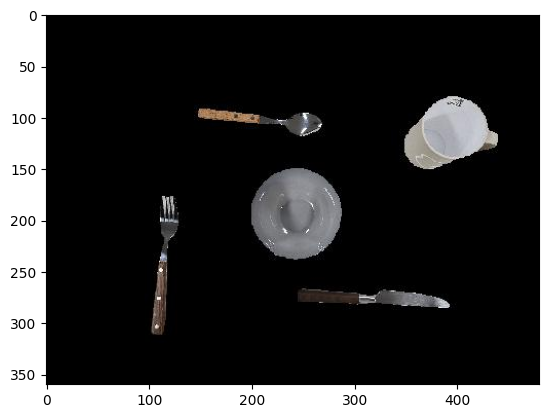

Score: [0.5730496]


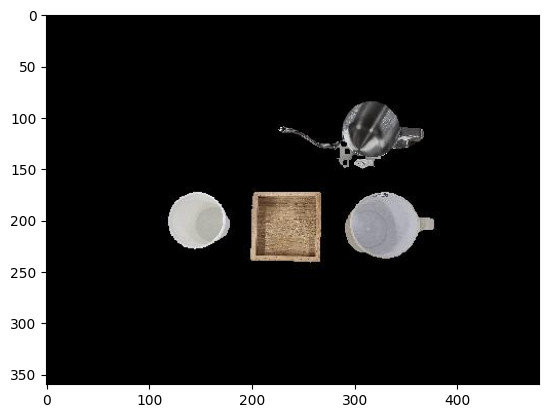

Score: [0.7175564]


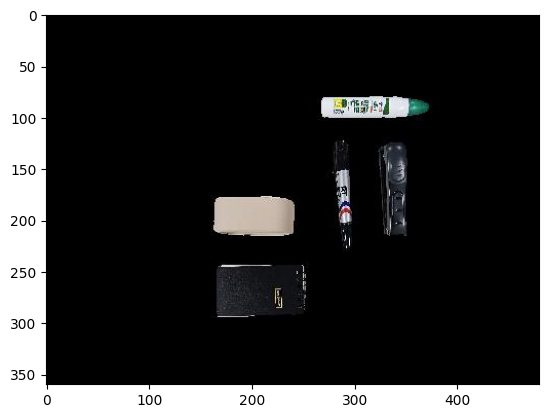

Score: [0.6499906]


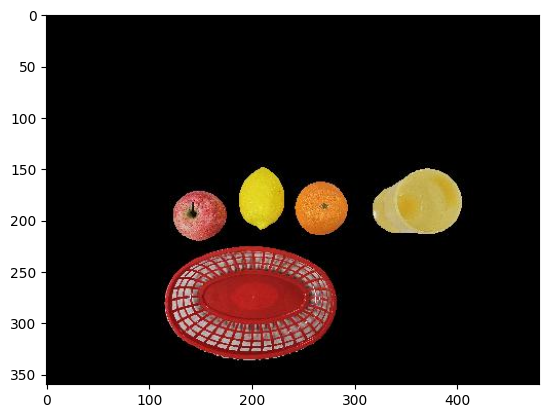

Score: [0.31563446]


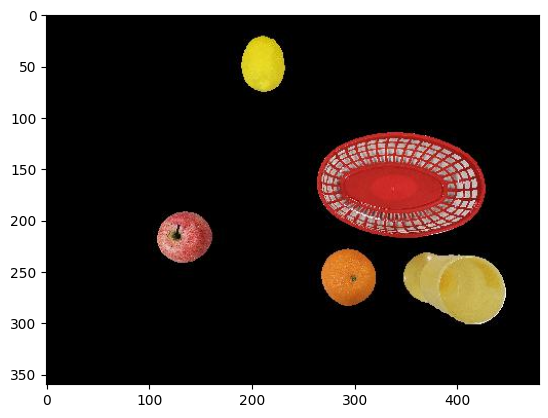

Score: [0.8336559]


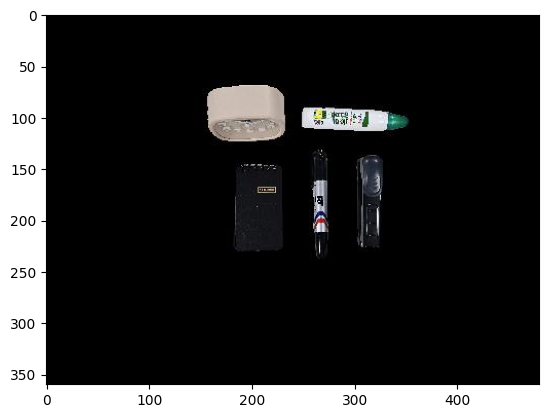

Score: [0.49417487]


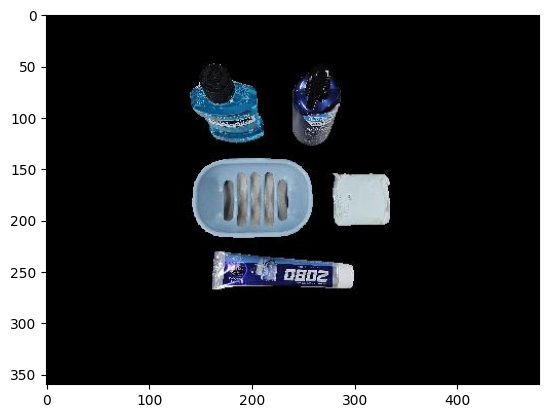

Score: [0.20602652]


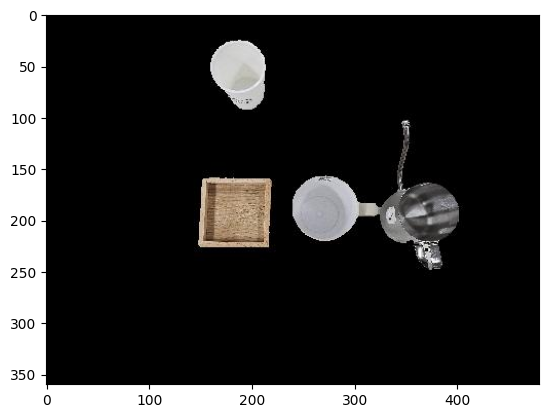

Score: [0.41326004]


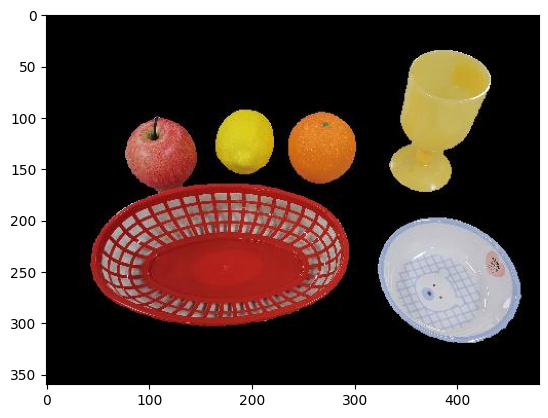

In [21]:
for i in range(len(real_images)):
    print("Score:", reward[i])
    plt.imshow(npy_images[i])
    plt.show()

In [24]:
np.array(im).shape

(360, 480, 3)

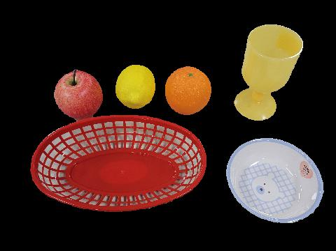

In [34]:
ratio = 0.7
H = int(360 * ratio)
W = int(480 * ratio)
im.resize([W, H])

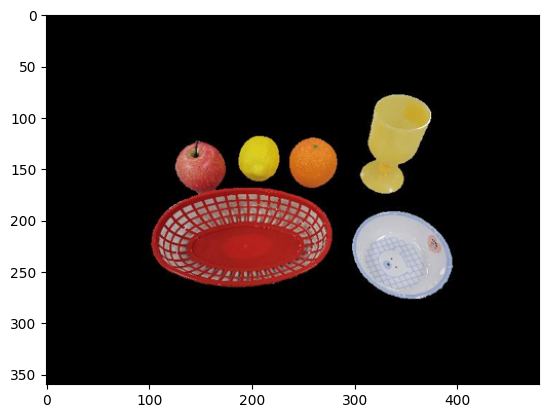

In [35]:
ratio = 0.7
H = int(360 * ratio)
W = int(480 * ratio)
h_pad = [int(360 * (1-ratio)/2), 360 - (int(360 * ratio) + int(360 * (1-ratio)/2))]
w_pad = [int(480 * (1-ratio)/2), 480 - (int(480 * ratio) + int(480 * (1-ratio)/2))]

im_new = np.pad(np.array(im.resize([W, H])), [h_pad, w_pad, [0,0]])
plt.imshow(im_new)

In [61]:
real_images = sorted([f for f in os.listdir('/home/gun/Desktop/segment-anything/notebooks/images') if f[:1]=='F'])
image_dir = '/home/gun/Desktop/segment-anything/notebooks/images'

ratio = 0.7
H = int(360 * ratio)
W = int(480 * ratio)
h_pad = [int(360 * (1-ratio)/2), 360 - (int(360 * ratio) + int(360 * (1-ratio)/2))]
w_pad = [int(480 * (1-ratio)/2), 480 - (int(480 * ratio) + int(480 * (1-ratio)/2))]

npy_images = []
for img_file in real_images:
    img_path = os.path.join(image_dir, img_file)
    im = Image.open(img_path)
    
    im_new = np.pad(np.array(im.resize([W, H])), [h_pad, w_pad, [0,0]])
    npy_images.append(im_new/255.)

npy_images = np.concatenate(npy_images).reshape(len(npy_images), 360, 480, 3)

state = torch.Tensor(npy_images).permute([0,3,1,2]).to(torch.float32).cuda()
state = preprocess(state)
reward = model(state).cpu().detach().numpy()
print(reward)

[[0.66273135]
 [0.3392525 ]
 [0.16360146]
 [0.9175989 ]
 [0.57400596]
 [0.3139359 ]
 [0.81441677]
 [0.6332661 ]
 [0.870866  ]
 [0.40649754]
 [0.03509683]
 [0.81791264]
 [0.9829603 ]
 [0.8789572 ]
 [0.3604353 ]
 [0.65764385]
 [0.57778126]
 [0.4247076 ]]


Score: [0.66273135]


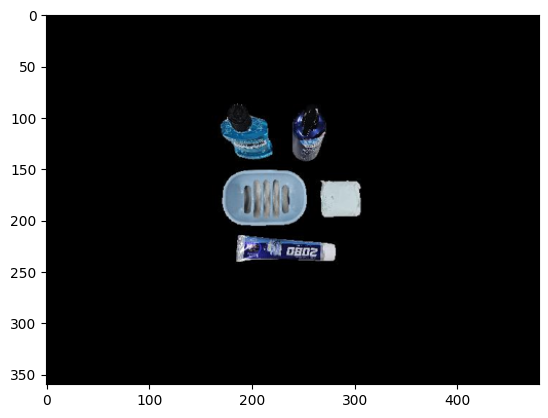

Score: [0.3392525]


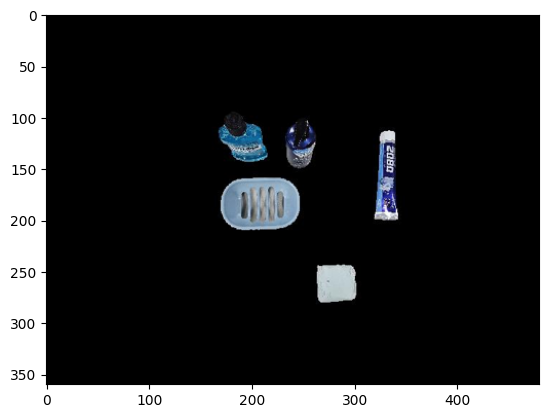

Score: [0.16360146]


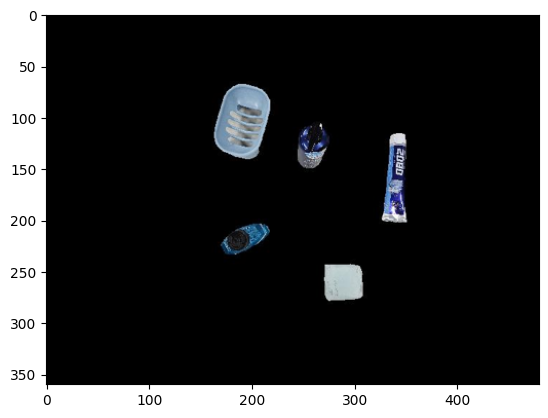

Score: [0.9175989]


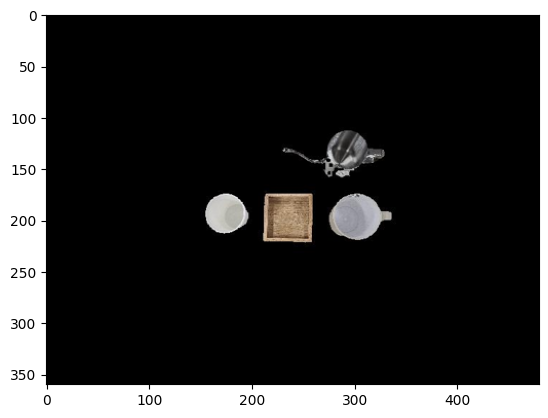

Score: [0.57400596]


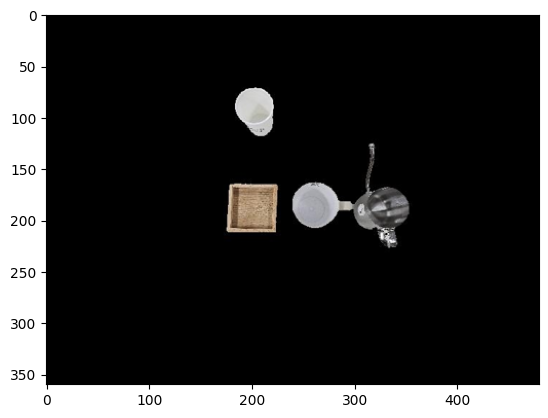

Score: [0.3139359]


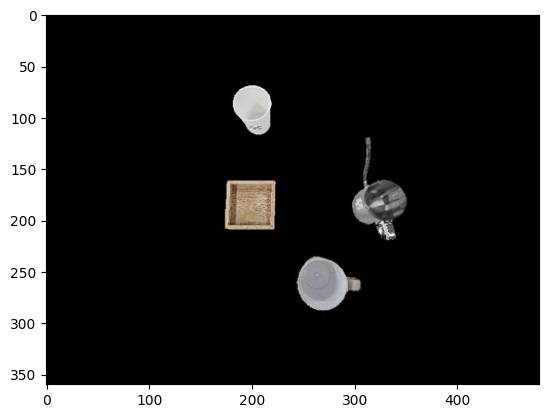

Score: [0.81441677]


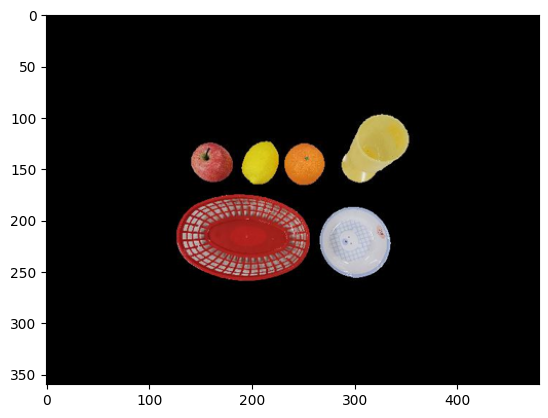

Score: [0.6332661]


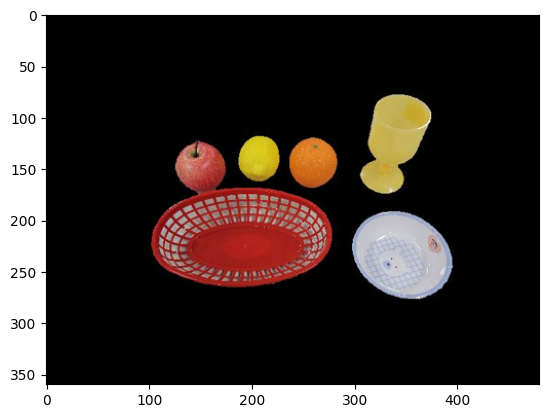

Score: [0.870866]


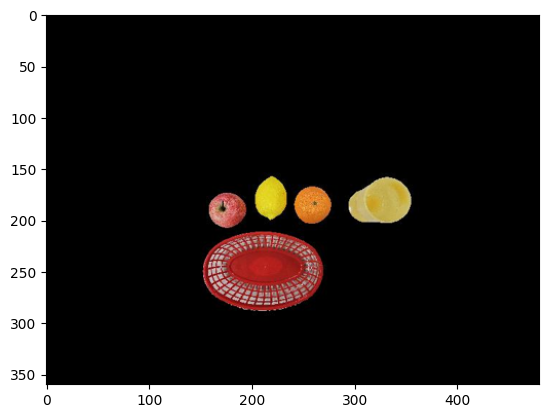

Score: [0.40649754]


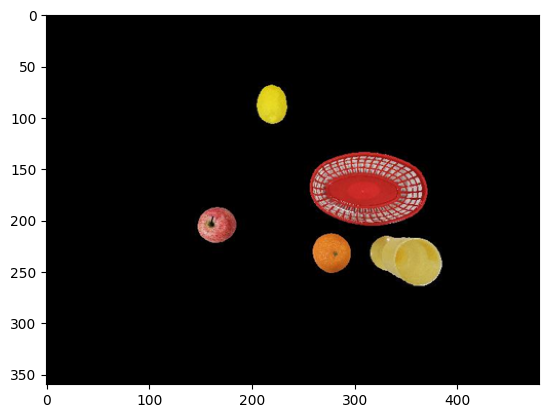

Score: [0.03509683]


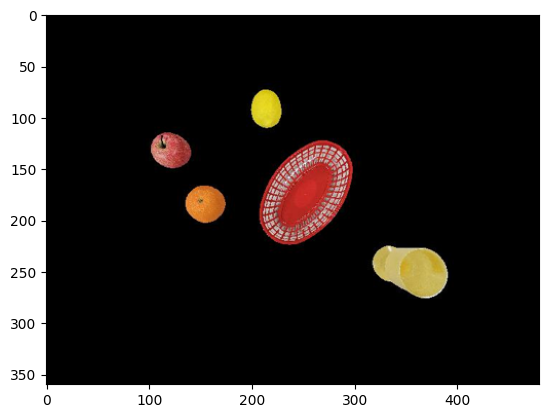

Score: [0.81791264]


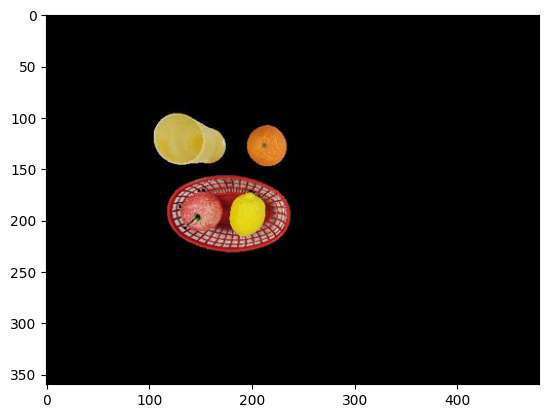

Score: [0.9829603]


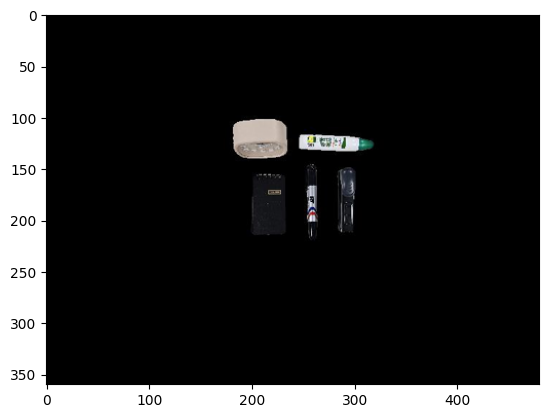

Score: [0.8789572]


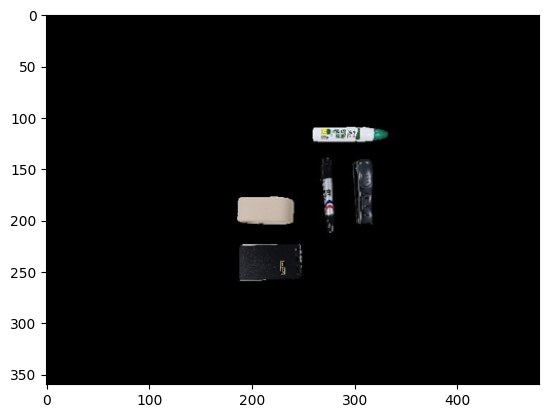

Score: [0.3604353]


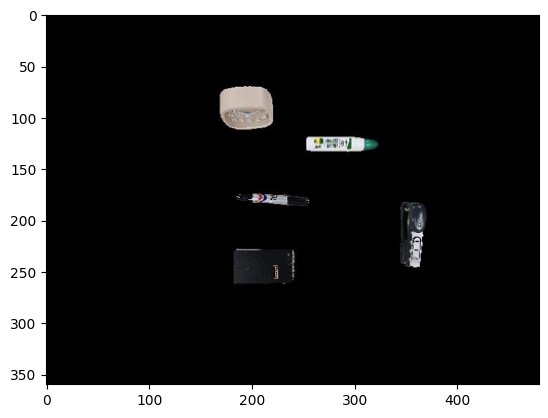

Score: [0.65764385]


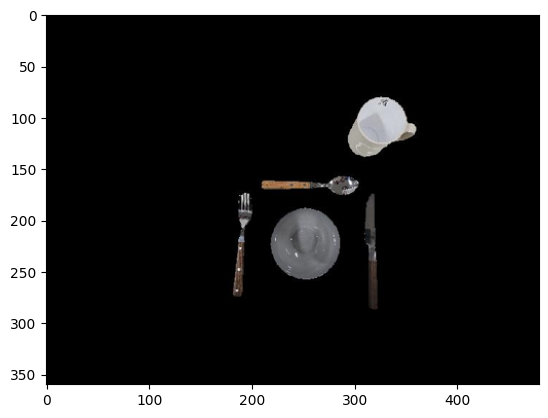

Score: [0.57778126]


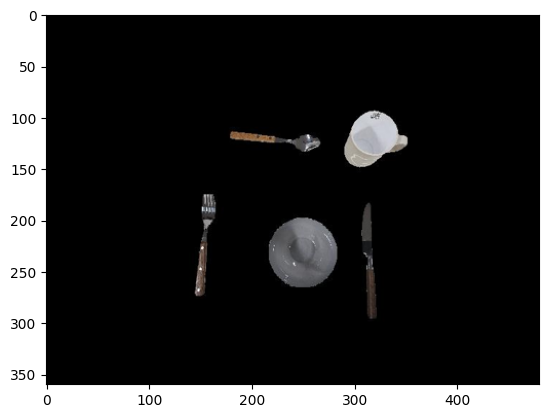

Score: [0.4247076]


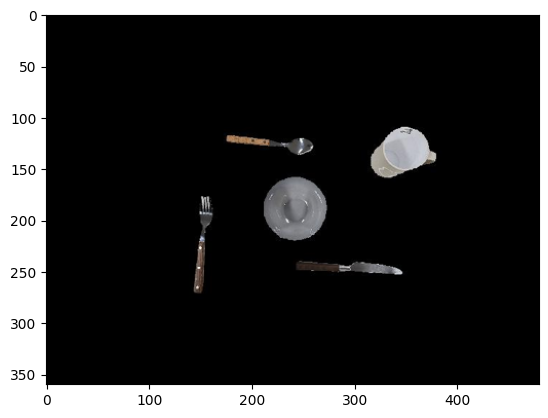

In [62]:
for i in range(len(real_images)):
    print("Score:", reward[i])
    plt.imshow(npy_images[i])
    plt.show()

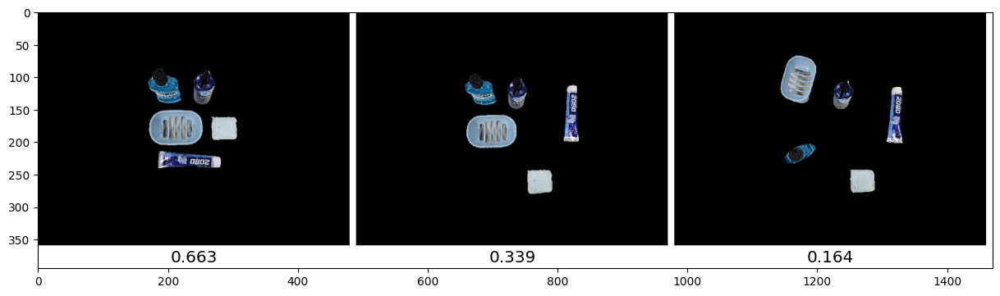

In [81]:
scenes = np.arange(3)

plt.figure(figsize=(15, 5))
result = np.ones([395, 490*len(scenes), 3])
for i in scenes:
    plt.text(490*i+240, 385, '%.3f'%reward[i][0], horizontalalignment="center", fontsize='x-large')
    result[:360, 490*i:490*i+480,:] = npy_images[i]
plt.imshow(result) #npy_images[i])
plt.show()

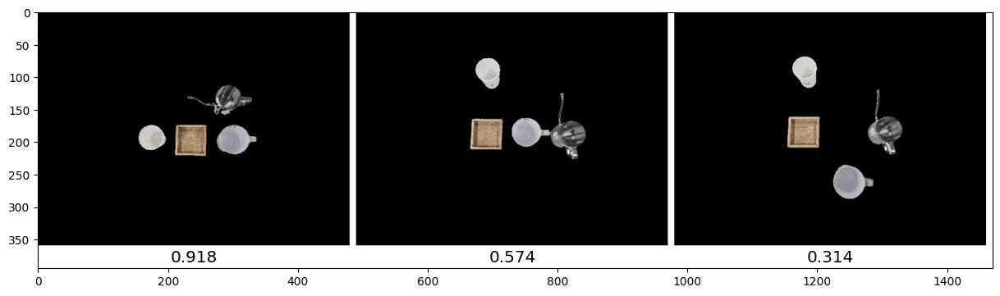

In [84]:
scenes = [3,4,5]

plt.figure(figsize=(15, 5))
result = np.ones([395, 490*len(scenes), 3])
for i, s in enumerate(scenes):
    plt.text(490*i+240, 385, '%.3f'%reward[s][0], horizontalalignment="center", fontsize='x-large')
    result[:360, 490*i:490*i+480,:] = npy_images[s]
plt.imshow(result) #npy_images[i])
plt.show()

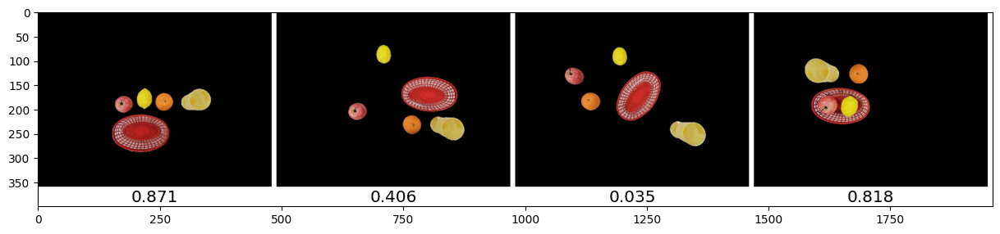

In [93]:
scenes = [8,9,10,11]

plt.figure(figsize=(15, 5))
result = np.ones([400, 490*len(scenes), 3])
for i, s in enumerate(scenes):
    plt.text(490*i+240, 390, '%.3f'%reward[s][0], horizontalalignment="center", fontsize='x-large')
    result[:360, 490*i:490*i+480,:] = npy_images[s]
plt.imshow(result) #npy_images[i])
plt.show()

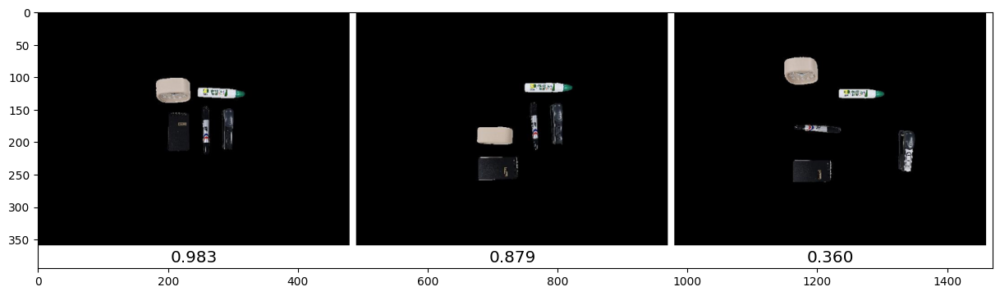

In [90]:
scenes = [12, 13, 14]

plt.figure(figsize=(15, 5))
result = np.ones([395, 490*len(scenes), 3])
for i, s in enumerate(scenes):
    plt.text(490*i+240, 385, '%.3f'%reward[s][0], horizontalalignment="center", fontsize='x-large')
    result[:360, 490*i:490*i+480,:] = npy_images[s]
plt.imshow(result) #npy_images[i])
plt.show()

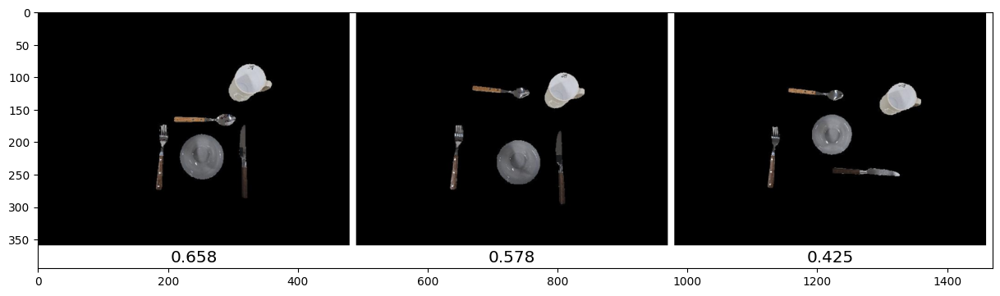

In [91]:
scenes = [15,16,17]

plt.figure(figsize=(15, 5))
result = np.ones([395, 490*len(scenes), 3])
for i, s in enumerate(scenes):
    plt.text(490*i+240, 385, '%.3f'%reward[s][0], horizontalalignment="center", fontsize='x-large')
    result[:360, 490*i:490*i+480,:] = npy_images[s]
plt.imshow(result) #npy_images[i])
plt.show()